# AI3I - NCAA March Mania 2025

Predicting the outcomes of March-Madness!

### Problem overview

Each season there are thousands of NCAA® basketball games played between Division I college basketball teams, culminating in March Madness®, the national championship men's and women's tournaments that run from mid-March until their championship games in early April. We have a large amount of historical data about college basketball games and teams, going back many years. Armed with this historical data, we explore it and develop our way of predicting March Madness® game outcomes.

### Dataset description

Our dataset contains men's and women's regular season and NCAA® tournament results with team box-score statistics for every game, from season 2003 until 2025. Each season, a team accessing the NCAA® tournament is assigned with a seed, which is used to create the matchups; a dataset with all the seeds of those teams that accessed the tournament is available.  
**For men's only**, ordinal rankings assigned from various ranking systems are available, from season 2003 onwards.

### Project's goal

The goal of the project is to use regular season results to create features for each team, and use such features to predict the outcomes of the NCAA® tournament. We will use data from season 2003-2024 as training/validation, and season 2025 to test our predictions.

### Evaluation metric

The competition rank solutions based on the **Brier score** (mean squared error between predicted probability and outcome):

$$\text{Brier} = \frac{1}{N}\sum_{i=1}^{N}(p_i - y_i)^2$$



In [66]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn
import warnings
import xgboost as xgb
import optuna
from sklearn.metrics import log_loss, brier_score_loss, mean_absolute_error, mean_squared_error
from sklearn.preprocessing import StandardScaler
from scipy.interpolate import UnivariateSpline

warnings.filterwarnings("ignore")
pd.set_option("display.max_column", 999) # to visualize all the columns

In [67]:
# ── Dashboard imports ──────────────────────────────────────────────────────
import ipywidgets as widgets
from ipywidgets import VBox, HBox, Output, Tab, Layout, HTML
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from IPython.display import display, clear_output
print('Dashboard imports ready.')


Dashboard imports ready.


## Data Loading

In [68]:
data_dir = "/Users/shariqansari/Downloads/march-machine-learning-mania-2026"

# M -> men's basketball
M_regular_results_df = pd.read_csv(f"{data_dir}/MRegularSeasonDetailedResults.csv")
M_tourney_results_df = pd.read_csv(f"{data_dir}/MNCAATourneyDetailedResults.csv")
M_seeds_df = pd.read_csv(f"{data_dir}/MNCAATourneySeeds.csv")
M_massey_ordinals_df = pd.read_csv(f"{data_dir}/MMasseyOrdinals.csv")

# W -> women's basketball 
W_regular_results_df = pd.read_csv(f"{data_dir}/WRegularSeasonDetailedResults.csv")
W_tourney_results_df = pd.read_csv(f"{data_dir}/WNCAATourneyDetailedResults.csv")
W_seeds_df = pd.read_csv(f"{data_dir}/WNCAATourneySeeds.csv")

We tag each dataset with a `Category` column (0 = Men, 1 = Women) and concatenate Men's and Women's data into unified DataFrames. Training on both categories simultaneously gives the model more data and lets it learn shared basketball patterns.

In [69]:
category = {"Men":0, "Women":1}

M_regular_results_df["Category"] = category["Men"]
M_tourney_results_df["Category"] = category["Men"]
W_regular_results_df["Category"] = category["Women"]
W_tourney_results_df["Category"] = category["Women"]

In [70]:
regular_results_df = pd.concat([M_regular_results_df, W_regular_results_df])
tourney_results_df = pd.concat([M_tourney_results_df, W_tourney_results_df])
seeds_df = pd.concat([M_seeds_df, W_seeds_df])

## Data exploration

In [71]:
regular_results_df.head()

,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT,WFGM,WFGA,WFGM3,WFGA3,WFTM,WFTA,WOR,WDR,WAst,WTO,WStl,WBlk,WPF,LFGM,LFGA,LFGM3,LFGA3,LFTM,LFTA,LOR,LDR,LAst,LTO,LStl,LBlk,LPF,Category
0,2003,10,1104,68,1328,62,N,0,27,58,3,14,11,18,14,24,13,23,7,1,22,22,53,2,10,16,22,10,22,8,18,9,2,20,0
1,2003,10,1272,70,1393,63,N,0,26,62,8,20,10,19,15,28,16,13,4,4,18,24,67,6,24,9,20,20,25,7,12,8,6,16,0
2,2003,11,1266,73,1437,61,N,0,24,58,8,18,17,29,17,26,15,10,5,2,25,22,73,3,26,14,23,31,22,9,12,2,5,23,0
3,2003,11,1296,56,1457,50,N,0,18,38,3,9,17,31,6,19,11,12,14,2,18,18,49,6,22,8,15,17,20,9,19,4,3,23,0
4,2003,11,1400,77,1208,71,N,0,30,61,6,14,11,13,17,22,12,14,4,4,20,24,62,6,16,17,27,21,15,12,10,7,1,14,0


Massey ordinals contains ranking assigned by external systems. It exists for men's competition only

In [72]:
M_massey_ordinals_df

,Season,RankingDayNum,SystemName,TeamID,OrdinalRank
0,2003,35,SEL,1102,159
1,2003,35,SEL,1103,229
2,2003,35,SEL,1104,12
3,2003,35,SEL,1105,314
4,2003,35,SEL,1106,260
...,...,...,...,...,...
5864996,2026,133,WLS,1477,318
5864997,2026,133,WLS,1478,303
5864998,2026,133,WLS,1479,287
5864999,2026,133,WLS,1480,293


Do we have nan values?

In [73]:
print("NaN values?")
print("")
print(f"Regular Season results: {any(regular_results_df.isna().any())}")
print(f"Tourney results:        {any(tourney_results_df.isna().any())}")
print(f"Ordinal rankings:       {any(M_massey_ordinals_df.isna().any())}")

NaN values?

Regular Season results: False
Tourney results:        False
Ordinal rankings:       False


Let's see the journey of a team during last season

In [74]:
season = 2025
team_id = 1104

r = regular_results_df[
    (regular_results_df["Season"]==season) & 
    ((regular_results_df["WTeamID"]==team_id) | (regular_results_df["LTeamID"]==team_id))]

t = tourney_results_df[
    (tourney_results_df["Season"]==season) & 
    ((tourney_results_df["WTeamID"]==team_id) | (tourney_results_df["LTeamID"]==team_id))]

r["Type"] = "regular season"
t["Type"] = "tournament"

rt = pd.concat([r,t])
rt["Outcome"] = np.where(rt["WTeamID"] == team_id, "win", "lose")

rt[["DayNum", "WScore", "LScore", "Type", "Outcome"]]

,DayNum,WScore,LScore,Type,Outcome
113241,0,110,54,regular season,win
113411,4,88,79,regular season,win
113547,7,72,64,regular season,win
113724,11,87,78,regular season,lose
113916,16,100,87,regular season,win
114219,22,85,80,regular season,win
114275,23,95,90,regular season,win
114447,26,83,81,regular season,lose
114563,30,94,79,regular season,win
114859,40,83,75,regular season,win


### Ranking stats
Seeds describe team's ranking (according to experts) based on their prior performance throughout the regular season. They are alphanumeric strings, with the first character determining the region of the team. An additional letter is added to distinguish teams belonging to the same region. We will use only the digits of the seed to represent their ranking.

NB: only tournament's teams are assigned with a seed

In [75]:
seeds_df[["Seed"]].drop_duplicates()

,Seed
0,W01
1,W02
2,W03
3,W04
4,W05
...,...
2551,Z10b
1670,Z12a
1671,Z12b
1769,X10a


Which seeds did our team have? Which average ordinal ranking?

In [76]:
seeds_df[(seeds_df["Season"]==season) & (seeds_df["TeamID"]==team_id)]

,Season,Seed,TeamID
2559,2025,W02,1104


Let's compute mean `OrdinalRank` across all ranking systems for team 1104 during season 2025, grouped by ranking day.

In [77]:
M_massey_ordinals_df[(M_massey_ordinals_df["Season"]==season) & (M_massey_ordinals_df["TeamID"]==team_id)].groupby("RankingDayNum")["OrdinalRank"].mean().reset_index().tail(5)

,RankingDayNum,OrdinalRank
14,107,4.173077
15,114,5.094340
16,121,4.981818
17,128,5.035714
18,133,5.553571


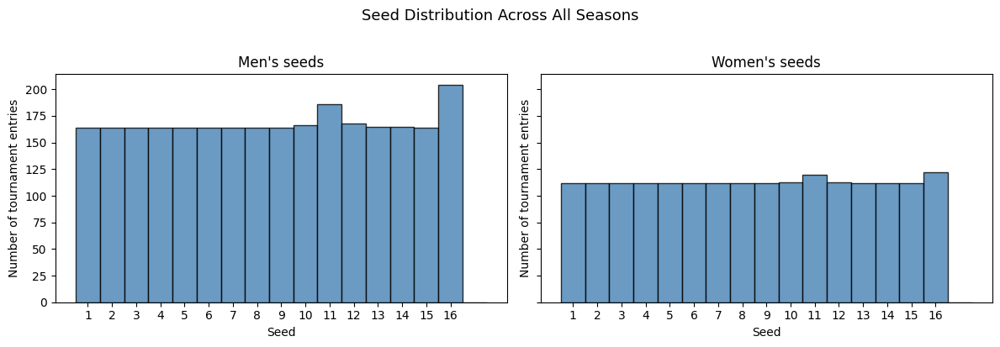

In [78]:
# distribution of numeric seeds across all seasons, for Men and Women
int_seeds_M = M_seeds_df['Seed'].map(lambda x: int(x[1:3]))
int_seeds_W = W_seeds_df['Seed'].map(lambda x: int(x[1:3]))

fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
for ax, seeds, title in zip(axes, [int_seeds_M, int_seeds_W], ["Men's seeds", "Women's seeds"]):
    ax.hist(seeds, bins=range(1, 19), edgecolor='black', align='left', color='steelblue', alpha=0.8)
    ax.set_title(title)
    ax.set_xlabel('Seed')
    ax.set_ylabel('Number of tournament entries')
    ax.set_xticks(range(1, 17))
plt.suptitle('Seed Distribution Across All Seasons', y=1.02, fontsize=13)
plt.tight_layout()
plt.show()

Some games do not end at the regular time and 1 or more OT (overtime) are played. This means that stats are collected for a longer time (higher scored points, rebounds, etc.)

<Axes: xlabel='NumOT'>

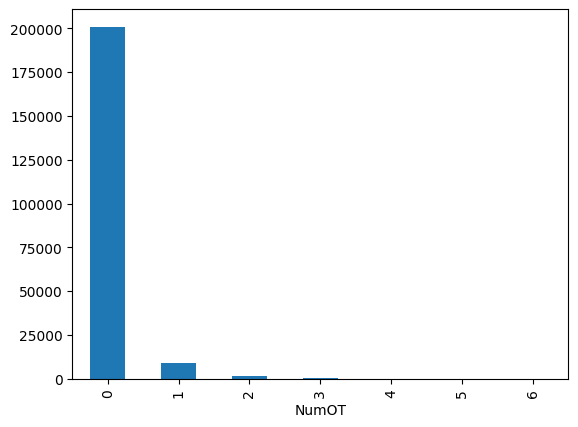

In [79]:
regular_results_df["NumOT"].value_counts().plot(kind="bar")

Is winning at home easier than winning away?

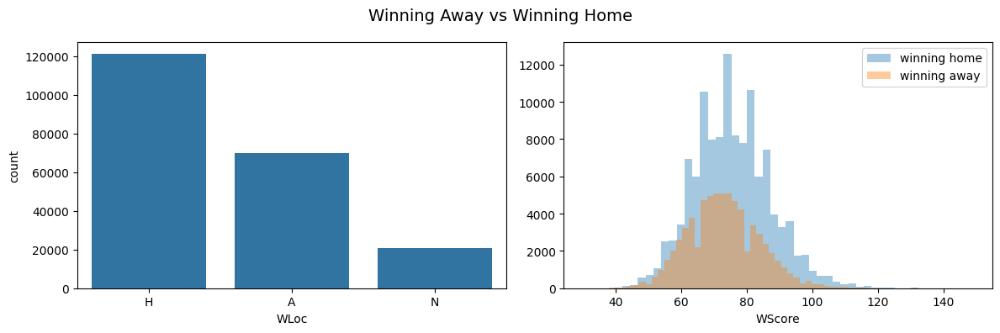

In [80]:
s1 = regular_results_df[regular_results_df["WLoc"]== "H"]["WScore"]
s2 = regular_results_df[regular_results_df["WLoc"]== "A"]["WScore"]

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

seaborn.barplot(x=regular_results_df["WLoc"].value_counts().index, 
                y=regular_results_df["WLoc"].value_counts(),
                ax=axes[0])
seaborn.distplot(s1, label="winning home", kde=False, ax=axes[1])
seaborn.distplot(s2, label="winning away", kde=False, ax=axes[1])

axes[1].legend()
plt.suptitle('Winning Away vs Winning Home', fontsize=14)
plt.tight_layout()
plt.show()

we can take into account the home advantage by correcting the raw scores with the mean differences. 

In [81]:
home_score_mean = s1.mean()
away_score_mean = s2.mean()
home_advantage = (home_score_mean - away_score_mean)/2

print(f"The mean score when winning home is: {home_score_mean}")
print(f"The mean score when winning away is: {away_score_mean}")
print("")
print(f"Mean home advantage points is: {home_score_mean - away_score_mean}") ## why not display corrected advantage

The mean score when winning home is: 75.3961703532519
The mean score when winning away is: 72.77674365325964

Mean home advantage points is: 2.6194266999922604


Stats percentages might capture better the average performance of a team throughout a season with respect to raw stats

In [82]:
rr = regular_results_df.copy()

rr["WFG%"] = rr["WFGM"]/rr["WFGA"]
rr["WFG%3"] = rr["WFGM3"]/rr["WFGA3"]
rr["WFT%"] = rr["WFTM"]/rr["WFTA"]

rr["LFG%"] = rr["LFGM"]/rr["LFGA"]
rr["LFG%3"] = rr["LFGM3"]/rr["LFGA3"]
rr["LFT%"] = rr["LFTM"]/rr["LFTA"]

columns_to_describe = ['WScore','LScore','WLoc','WFGM','WFGA','WFG%',
                       'WFGM3','WFGA3','WFG%3','WFTM','WFTA','WFT%','WOR',
                       'WDR','WAst','WTO','WStl','WBlk','WPF',
                       'LFGM','LFGA','LFG%','LFGM3','LFGA3','LFG%3',
                       'LFTM','LFTA','LFT%','LOR','LDR','LAst','LTO',
                       'LStl','LBlk','LPF']
winning_teams_columns = [c for c in columns_to_describe if c.startswith("W")]
losing_teams_columns = [c for c in columns_to_describe if c.startswith("L")]

In [83]:
rr[winning_teams_columns].describe()

,WScore,WFGM,WFGA,WFG%,WFGM3,WFGA3,WFG%3,WFTM,WFTA,WFT%,WOR,WDR,WAst,WTO,WStl,WBlk,WPF
count,211716.000000,211716.000000,211716.000000,211716.000000,211716.000000,211716.000000,211702.000000,211716.000000,211716.000000,211688.000000,211716.000000,211716.000000,211716.000000,211716.000000,211716.000000,211716.000000,211716.000000
mean,74.347182,26.237209,57.166081,0.460710,6.963810,18.940973,0.365366,14.908954,20.851622,0.715244,10.973960,25.962469,14.838156,13.492216,7.672505,3.732968,16.683028
std,11.458923,4.821583,7.811166,0.068897,3.183975,6.366821,0.117219,6.112946,7.971070,0.118703,4.461546,5.090498,4.530240,4.464958,3.495792,2.417302,4.214254
min,30.000000,9.000000,26.000000,0.180000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,66.000000,23.000000,52.000000,0.413793,5.000000,14.000000,0.285714,11.000000,15.000000,0.642857,8.000000,22.000000,12.000000,10.000000,5.000000,2.000000,14.000000
50%,74.000000,26.000000,57.000000,0.459459,7.000000,19.000000,0.363636,14.000000,20.000000,0.722222,11.000000,26.000000,15.000000,13.000000,7.000000,3.000000,16.000000
75%,82.000000,29.000000,62.000000,0.508197,9.000000,23.000000,0.441176,19.000000,26.000000,0.800000,14.000000,29.000000,18.000000,16.000000,10.000000,5.000000,19.000000
max,149.000000,58.000000,113.000000,0.800000,30.000000,63.000000,1.000000,50.000000,67.000000,1.000000,45.000000,58.000000,45.000000,40.000000,36.000000,21.000000,42.000000


In [84]:
rr[losing_teams_columns].describe()

,LScore,LFGM,LFGA,LFG%,LFGM3,LFGA3,LFG%3,LFTM,LFTA,LFT%,LOR,LDR,LAst,LTO,LStl,LBlk,LPF
count,211716.000000,211716.000000,211716.000000,211716.000000,211716.000000,211716.000000,211709.000000,211716.000000,211716.000000,211581.000000,211716.00000,211716.000000,211716.000000,211716.000000,211716.000000,211716.000000,211716.000000
mean,61.307204,22.055338,57.335029,0.386048,5.734385,19.376311,0.292827,11.462143,16.826839,0.679926,10.68812,21.860960,11.232481,15.130113,6.462365,2.850262,18.797054
std,11.413701,4.498934,7.725899,0.067848,2.822170,6.359618,0.109315,5.248387,6.986135,0.138866,4.40488,4.704645,3.770125,5.044259,2.985238,2.033009,4.585103
min,11.000000,3.000000,25.000000,0.060000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1.000000,0.000000,0.000000,0.000000,0.000000,3.000000
25%,54.000000,19.000000,52.000000,0.339623,4.000000,15.000000,0.222222,8.000000,12.000000,0.600000,8.00000,19.000000,9.000000,12.000000,4.000000,1.000000,16.000000
50%,61.000000,22.000000,57.000000,0.385965,5.000000,19.000000,0.291667,11.000000,16.000000,0.687500,10.00000,22.000000,11.000000,15.000000,6.000000,3.000000,19.000000
75%,69.000000,25.000000,62.000000,0.431373,8.000000,23.000000,0.363636,15.000000,21.000000,0.772727,13.00000,25.000000,14.000000,18.000000,8.000000,4.000000,22.000000
max,144.000000,53.000000,111.000000,0.727273,25.000000,80.000000,1.000000,48.000000,65.000000,1.000000,38.00000,53.000000,34.000000,49.000000,26.000000,18.000000,47.000000


Let's plot some features distribution  

**NOTE FOR SHARIQ, YOU MIGHT INVESTIGATE THIS**
- understand which features are better to plot (more on this later in the notebook!)

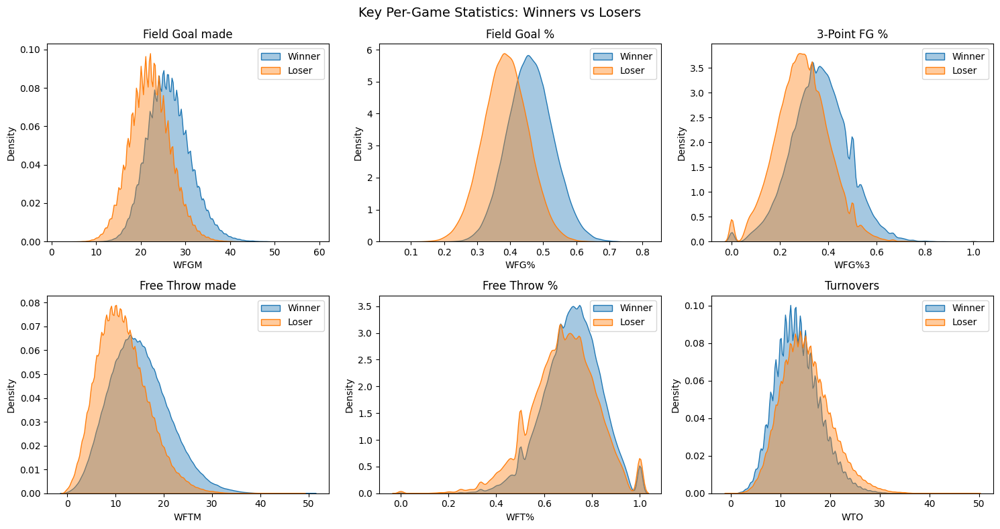

In [85]:
# comparing key per-game statistics for winners and losers
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
stats_pairs = [
    ('WFGM',    'LFGM',    'Field Goal made'),
    ('WFG%',    'LFG%',    'Field Goal %'),
    ('WFG%3',   'LFG%3',   '3-Point FG %'),
    ('WFTM',    'LFTM',    'Free Throw made'),
    ('WFT%',    'LFT%',    'Free Throw %'),
    ('WTO',     'LTO',     'Turnovers'),
]
for ax, (w_col, l_col, title) in zip(axes.flat, stats_pairs):
    seaborn.kdeplot(rr[w_col].dropna(), label='Winner', ax=ax, fill=True, alpha=0.4)
    seaborn.kdeplot(rr[l_col].dropna(), label='Loser',  ax=ax, fill=True, alpha=0.4)
    ax.set_title(title)
    ax.legend()
plt.suptitle('Key Per-Game Statistics: Winners vs Losers', fontsize=14)
plt.tight_layout()
plt.show()

## Data preparation
Our current dataset is on the POV of winners: WTeam is always the winning team, and this might not be ideal for our predictions (which are inherently ordered). We want our model to be independent on the order of teams: we will process our dataset so to contain T1_stats and T2_stats, where T1 and T2 order do not determine the vicory.

We will duplicate our dataset, each match will appear twice, and each team will be one time T1 and one time T2.

Given the high number of matches with NumOT > 0, we will also apply an adjustment to take into account more stats collected:

$$\text{adjusted stat} = \text{raw stat} \times \frac{40}{40 + 5 \times \text{NumOT}}$$

`NB:` 40 corresponds to match duration, 5 correspond to over-time duration (in mins).

Our objective is to output a probability of victory for each match in the tournament, given the features built from the regular season results.


In [86]:
def prepare_df(df: pd.DataFrame) -> pd.DataFrame:
    """Transform winning-POV dataset into T1-T2 teams, where each match appears twice."""
    df = df.copy()
    columns_to_adjust = ['WScore', 'LScore', 'WFGM', 'WFGA', 'WFGM3', 'WFGA3', 'WFTM', 'WFTA', 'WOR', 'WDR',
        'WAst', 'WTO', 'WStl', 'WBlk', 'WPF', 'LFGM', 'LFGA', 'LFGM3', 'LFGA3',
        'LFTM', 'LFTA', 'LOR', 'LDR', 'LAst', 'LTO', 'LStl', 'LBlk', 'LPF']
    adjust_coeff = 40 / (df["NumOT"] * 5 + 40)

    for c in columns_to_adjust:
        df[c] = df[c] * adjust_coeff
    
    df_2 = df.copy()

    df["Outcome"] = "win"
    df["ScoreDiff"] = df["WScore"] - df["LScore"]
    df_2["Outcome"] = "lose"
    df_2["ScoreDiff"] = df_2["LScore"] - df_2["WScore"]

    df.columns = [c.replace("W","T1").replace("L","T2") for c in df.columns]
    df["T1Loc"] = df["T1T2oc"] # The replace function didn't work for this :P
    df["T2Loc"] = df["T1Loc"].apply(lambda x: "A" if x =="H" else "H" if x == "A" else "N")
    df_2.columns = [c.replace("W","T2").replace("L","T1") for c in df_2.columns]
    df_2["T1Loc"] = df["T2Loc"]
    df_2["T2Loc"] = df["T1Loc"]
    df.drop(columns=["T1T2oc"], inplace=True)
    df_2.drop(columns=["T2T1oc"], inplace=True)
    final_df = pd.concat([df,df_2]).reset_index(drop=True)

    return final_df

In [87]:
regular_results = prepare_df(regular_results_df)
tourney_results = prepare_df(tourney_results_df)
seeds = seeds_df.copy() # just to be coherent with the naming

## Feature Engineering
### Easy features
First of all, let's build easy features that we already have. Let's introduce seed for each team, and compute their difference (which is more informative than the absolute seed itself).

Remember that we will use regular season's results to compute the features, and tourney results to train our model and make predictions!



In [88]:
seeds["int_seed"] = seeds_df["Seed"].map((lambda x: int(x[1:3])))
seeds.drop(columns=["Seed"], inplace=True)
seeds_T1 = seeds.copy().rename(columns={"TeamID": "T1TeamID", "int_seed": "T1Seed"}) # to ease the merge
seeds_T2 = seeds.copy().rename(columns={"TeamID": "T2TeamID", "int_seed": "T2Seed"}) # to ease the merge

Tournaments results might give us some insights on their correlation with regular season results. We didn't do this research and we will simply drop all the stats related to those games.   

**NOTE FOR SHARIQ, YOU MIGHT INVESTIGATE THIS**
- instead of dropping those columns, do plots or compare those averages with regular season averages.
- whatever you can think of

Lets see if the average performance stats changes between the regular game compared with the tournament?

**Does team perform better when stakes are high??**

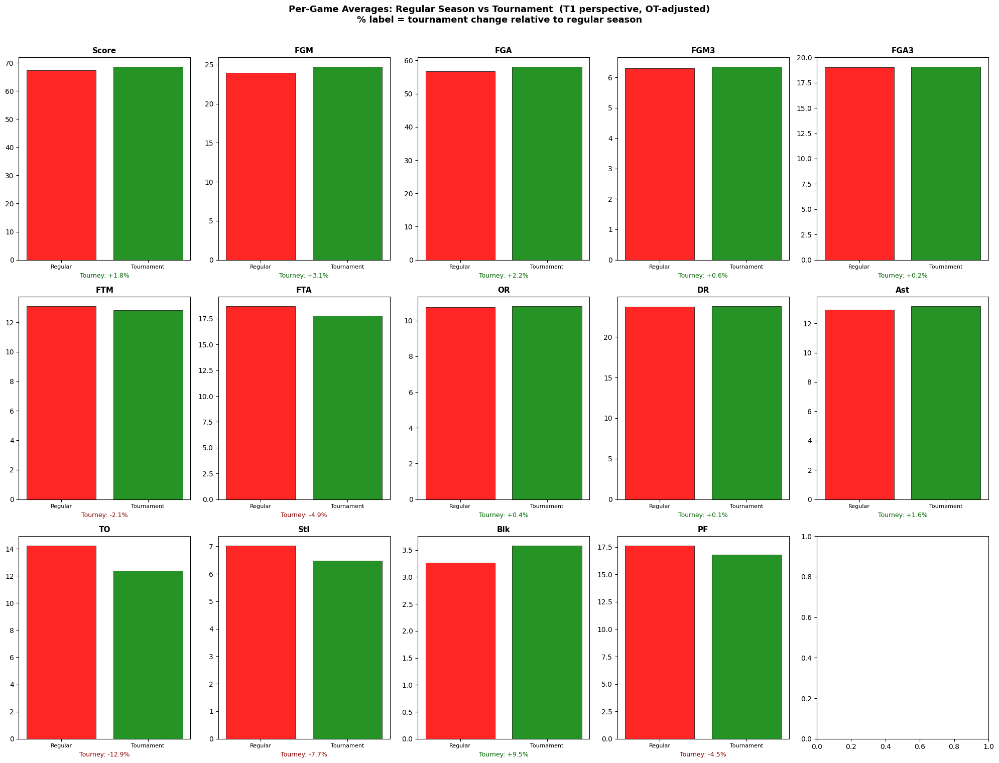

       Regular Season  Tournament  % Change
Score          67.314      68.558     1.847
FGM            23.968      24.706     3.081
FGA            56.825      58.058     2.169
FGM3            6.302       6.341     0.617
FGA3           19.017      19.056     0.206
FTM            13.077      12.805    -2.082
FTA            18.684      17.772    -4.880
OR             10.750      10.792     0.394
DR             23.733      23.761     0.120
Ast            12.943      13.154     1.628
TO             14.210      12.377   -12.902
Stl             7.018       6.477    -7.711
Blk             3.267       3.577     9.505
PF             17.605      16.814    -4.490


In [89]:
# Stats available in the prepared DataFrames (T1 perspective)
T1_STATS = ['T1Score','T1FGM','T1FGA','T1FGM3','T1FGA3',
            'T1FTM','T1FTA','T1OR','T1DR','T1Ast','T1TO','T1Stl','T1Blk','T1PF']
SHORT     = [s.replace('T1','') for s in T1_STATS]

reg_means   = regular_results[T1_STATS].mean()
tour_means  = tourney_results[T1_STATS].mean()
pct_changes = (tour_means - reg_means) / reg_means * 100

fig, axes = plt.subplots(3, 5, figsize=(20, 15))
axes = axes.flat

for ax, stat, short in zip(axes, T1_STATS, SHORT):
    vals   = [reg_means[stat], tour_means[stat]]
    labels = ['Regular', 'Tournament']
    colors = ['red', 'green']
    ax.bar(labels, vals, color=colors, alpha=0.85, edgecolor='black', linewidth=0.6)
    ax.set_title(short, fontsize=11, fontweight='bold')
    ax.tick_params(axis='x', labelsize=8)
    pct = pct_changes[stat]
    color = 'darkgreen' if pct > 0 else 'darkred'
    ax.set_xlabel(f'Tourney: {pct:+.1f}%', fontsize=9, color=color)

for ax in list(axes)[len(T1_STATS):]:
    ax.set_visible(False)

fig.suptitle(
    'Per-Game Averages: Regular Season vs Tournament  (T1 perspective, OT-adjusted)\n'
    '% label = tournament change relative to regular season',
    fontsize=13, fontweight='bold', y=1.01
)
plt.tight_layout()
plt.show()

# Summary table
summary = pd.DataFrame({'Regular Season': reg_means.values,
                        'Tournament':     tour_means.values,
                        '% Change':       pct_changes.values},
                       index=SHORT).round(3)
print(summary.to_string())


We can see that teams become more attacking as seen in increase in field goal, 3-pointers etc, at the same time the defence also increases as noted in increase of blocking.

Apart from average, does the distribution of the performance stats also changes??

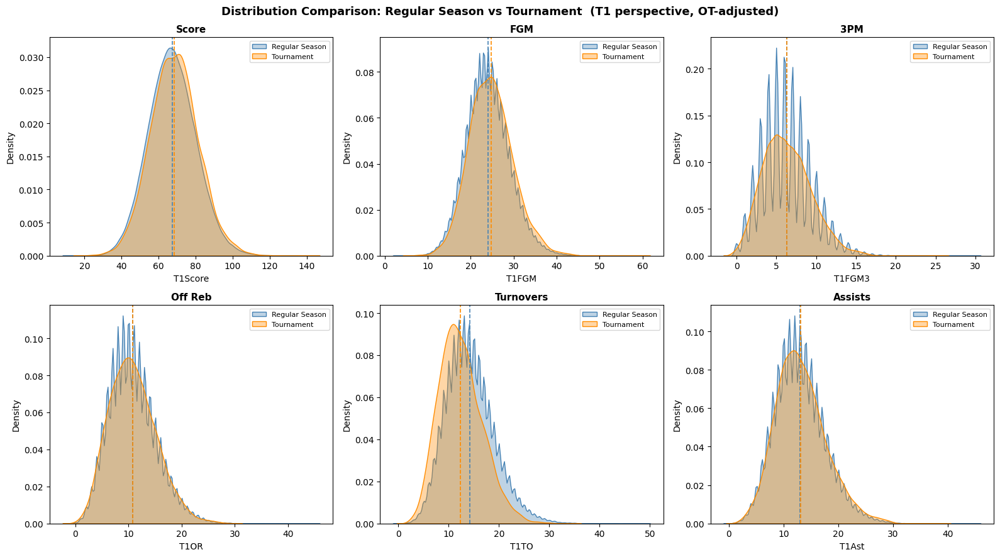

In [90]:
# Split by Category so Men's and Women's don't blur together
fig, axes = plt.subplots(2, 3, figsize=(16, 9))

KDE_STATS = [('T1Score','Score'), ('T1FGM','FGM'),  ('T1FGM3','3PM'),
             ('T1OR','Off Reb'),  ('T1TO','Turnovers'),('T1Ast','Assists')]

for ax, (col, label) in zip(axes.flat, KDE_STATS):
    seaborn.kdeplot(regular_results[col].dropna(),
                    label='Regular Season', ax=ax, fill=True, alpha=0.35, color='steelblue')
    seaborn.kdeplot(tourney_results[col].dropna(),
                    label='Tournament',     ax=ax, fill=True, alpha=0.35, color='darkorange')
    # vertical means
    ax.axvline(regular_results[col].mean(), color='steelblue',   linestyle='--', lw=1.2)
    ax.axvline(tourney_results[col].mean(), color='darkorange',  linestyle='--', lw=1.2)
    ax.set_title(label, fontsize=11, fontweight='bold')
    ax.legend(fontsize=8)

fig.suptitle('Distribution Comparison: Regular Season vs Tournament  (T1 perspective, OT-adjusted)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()


## Which regular-season stats best predict tournament win rate?

For each (Season, Team) we compute their regular-season average stats and their tournament win rate (`Outcome == 'win'`). Pearson r tells us which features have the most predictive signal — useful for feature selection.

In [94]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


def analyze_all_feature_correlations(
    regular_results: pd.DataFrame,
    tourney_results: pd.DataFrame,
    category_col="Category",
    exclude_cols=None,
    plot=True
):
    """
    Analyze correlations between ALL numeric regular-season features
    and tournament win rate.

    ----------------------------------------------------------------
    PURPOSE
    ----------------------------------------------------------------
    Automatically finds:

        "Which regular-season features best predict
         tournament success?"

    Instead of manually specifying feature columns,
    this function automatically selects all numeric features.

    ----------------------------------------------------------------
    PARAMETERS
    ----------------------------------------------------------------
    regular_results : pd.DataFrame
        Regular season dataset.

    tourney_results : pd.DataFrame
        Tournament dataset.

    category_col : str
        Grouping category column.

    exclude_cols : list[str], optional
        Columns to exclude manually.

    plot : bool
        Whether to display correlation plot.

    ----------------------------------------------------------------
    RETURNS
    ----------------------------------------------------------------
    corr_vals : pd.Series
        Correlations sorted from negative → positive.

    merged_corr : pd.DataFrame
        Dataset used for analysis.
    """

    # ------------------------------------------------------------
    # COPY DATAFRAMES
    # ------------------------------------------------------------
    regular_results = regular_results.copy()
    tourney_results = tourney_results.copy()

    # ------------------------------------------------------------
    # DEFAULT EXCLUDED COLUMNS
    # ------------------------------------------------------------
    #
    # These are identifiers / labels / non-feature columns
    #
    if exclude_cols is None:
        exclude_cols = [
            'Season',
            'DayNum',
            'T1TeamID',
            'T2TeamID',
            'Outcome',
            'Category'
            
        ]

    # ------------------------------------------------------------
    # AUTOMATICALLY DETECT NUMERIC FEATURES
    # ------------------------------------------------------------
    #
    # We select:
    #   - numeric columns only
    #   - columns beginning with T1
    #
    # because:
    #   T1 features represent the team itself
    #   T2 features represent opponents
    #
    numeric_cols = regular_results.select_dtypes(
        include=np.number
    ).columns.tolist()

    corr_stats = [
        c for c in numeric_cols
        if c.startswith("T1")
        and c not in exclude_cols
    ]

    print(f"\nDetected {len(corr_stats)} numeric T1 features.")

    # ------------------------------------------------------------
    # REGULAR-SEASON TEAM AVERAGES
    # ------------------------------------------------------------
    reg_avg_corr = (
        regular_results
        .groupby(['Season', 'T1TeamID', category_col])[corr_stats]
        .mean()
        .add_suffix('_reg')
    )

    # ------------------------------------------------------------
    # TOURNAMENT WIN RATE
    # ------------------------------------------------------------
    tourney_results['_win'] = (
        tourney_results['Outcome'] == 'win'
    ).astype(int)

    tour_winrate = (
        tourney_results
        .groupby(['Season', 'T1TeamID', category_col])
        .agg(WinRate=('_win', 'mean'))
        .reset_index()
        .set_index(['Season', 'T1TeamID', category_col])
    )

    # ------------------------------------------------------------
    # MERGE
    # ------------------------------------------------------------
    merged_corr = tour_winrate.join(reg_avg_corr, how='inner')

    # ------------------------------------------------------------
    # CORRELATIONS
    # ------------------------------------------------------------
    corr_vals = (
        merged_corr
        .corr()['WinRate']
        .drop('WinRate')
        .rename(
            index=lambda s: (
                s.replace('_reg', '')
                 .replace('T1', '')
            )
        )
        .sort_values()
    )

    # ------------------------------------------------------------
    # VISUALIZATION
    # ------------------------------------------------------------
    if plot:

        fig, ax = plt.subplots(figsize=(12, max(6, len(corr_vals) * 0.35)))

        bar_colors = [
            'seagreen' if v >= 0 else 'tomato'
            for v in corr_vals
        ]

        bars = ax.barh(
            corr_vals.index,
            corr_vals.values,
            color=bar_colors,
            edgecolor='black',
            linewidth=0.5,
            alpha=0.85
        )

        ax.axvline(0, color='black', linewidth=1)

        # Add correlation labels
        for val, patch in zip(corr_vals.values, bars):

            ax.text(
                val + (0.003 if val >= 0 else -0.003),
                patch.get_y() + patch.get_height()/2,
                f'{val:.3f}',
                va='center',
                ha='left' if val >= 0 else 'right',
                fontsize=8
            )

        ax.set_xlabel(
            'Pearson Correlation with Tournament Win Rate',
            fontsize=11
        )

        ax.set_title(
            'Regular-Season Features vs Tournament Success',
            fontsize=13,
            fontweight='bold'
        )

        plt.tight_layout()
        plt.show()

    # ------------------------------------------------------------
    # PRINT TOP FEATURES
    # ------------------------------------------------------------
    print("\nTop 10 POSITIVE predictors:")
    print(corr_vals.tail(10).to_string())

    print("\nTop 10 NEGATIVE predictors:")
    print(corr_vals.head(10).to_string())

    return corr_vals, merged_corr


Detected 14 numeric T1 features.


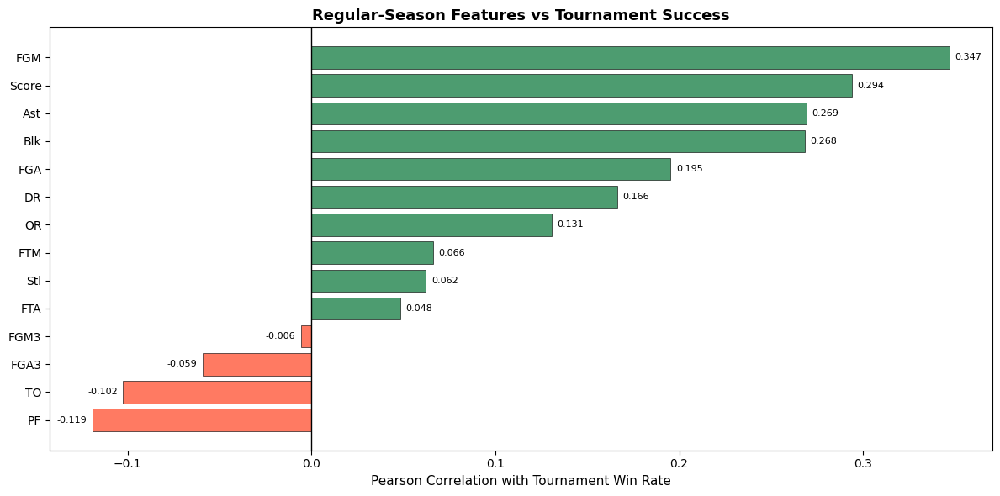


Top 10 POSITIVE predictors:
FTA      0.048209
Stl      0.062312
FTM      0.066090
OR       0.130641
DR       0.166213
FGA      0.195318
Blk      0.268275
Ast      0.269356
Score    0.294024
FGM      0.347055

Top 10 NEGATIVE predictors:
PF     -0.118914
TO     -0.102329
FGA3   -0.059075
FGM3   -0.005642
FTA     0.048209
Stl     0.062312
FTM     0.066090
OR      0.130641
DR      0.166213
FGA     0.195318


In [95]:
corr_vals, merged_corr = analyze_all_feature_correlations(
    regular_results,
    tourney_results
)

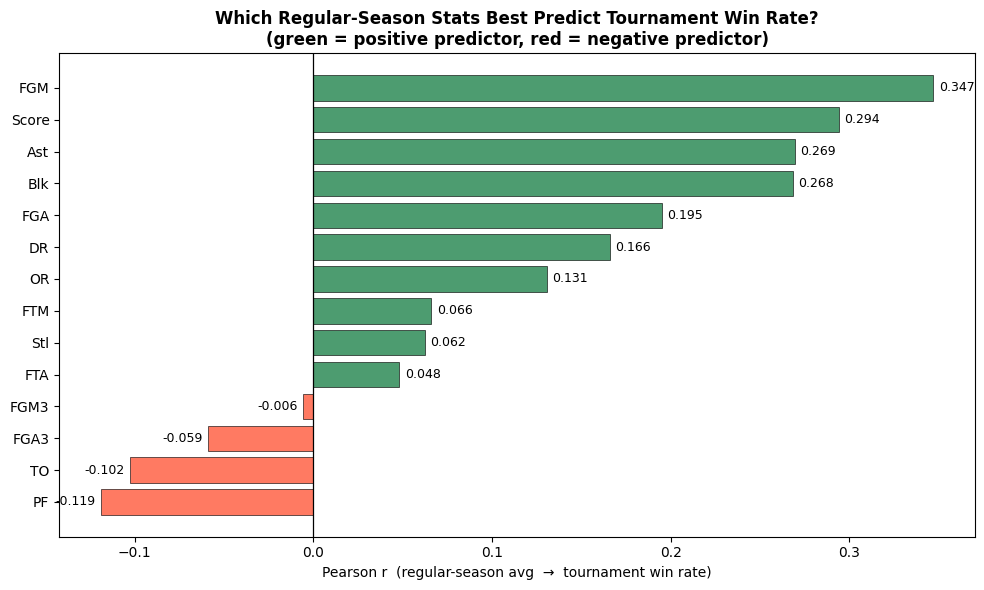


Top 5 POSITIVE predictors:
FGA      0.195318
Blk      0.268275
Ast      0.269356
Score    0.294024
FGM      0.347055

Top 5 NEGATIVE predictors:
PF     -0.118914
TO     -0.102329
FGA3   -0.059075
FGM3   -0.005642
FTA     0.048209


In [91]:
CORR_STATS = ['T1Score','T1FGM','T1FGA','T1FGM3','T1FGA3',
              'T1FTM','T1FTA','T1OR','T1DR','T1Ast','T1TO','T1Stl','T1Blk','T1PF']
SHORT_C    = [s.replace('T1','') for s in CORR_STATS]

# Regular-season averages per (Season, Team)
reg_avg_corr = (regular_results
                .groupby(['Season','T1TeamID','Category'])[CORR_STATS]
                .mean()
                .add_suffix('_reg'))

# Tournament win rate per (Season, Team)  — Outcome is 'win'/'lose'
tourney_results['_win'] = (tourney_results['Outcome'] == 'win').astype(int)
tour_winrate = (tourney_results
                .groupby(['Season','T1TeamID','Category'])
                .agg(WinRate=('_win','mean'))
                .reset_index()
                .set_index(['Season','T1TeamID','Category']))

merged_corr = tour_winrate.join(reg_avg_corr, how='inner')

corr_vals = (merged_corr
             .corr()['WinRate']
             .drop('WinRate')
             .rename(index=lambda s: s.replace('_reg','').replace('T1','')))
corr_vals = corr_vals.sort_values()

fig, ax = plt.subplots(figsize=(10, 6))
bar_colors = ['seagreen' if v >= 0 else 'tomato' for v in corr_vals]
bars = ax.barh(corr_vals.index, corr_vals.values,
               color=bar_colors, edgecolor='black', linewidth=0.5, alpha=0.85)
ax.axvline(0, color='black', linewidth=0.9)
for val, patch in zip(corr_vals.values, bars):
    ax.text(val + (0.003 if val >= 0 else -0.003),
            patch.get_y() + patch.get_height()/2,
            f'{val:.3f}', va='center',
            ha='left' if val >= 0 else 'right', fontsize=9)

ax.set_xlabel('Pearson r  (regular-season avg  →  tournament win rate)', fontsize=10)
ax.set_title('Which Regular-Season Stats Best Predict Tournament Win Rate?\n'
             '(green = positive predictor, red = negative predictor)', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

print("\nTop 5 POSITIVE predictors:")
print(corr_vals.tail(5).to_string())
print("\nTop 5 NEGATIVE predictors:")
print(corr_vals.head(5).to_string())


## Understanding the data drift across the years

Keeping an eye on the data drift is essential to understand the trend in the datset.

There are two types that matter here:

| Type | What changes | Example |
|---|---|---|
| **Covariate drift** | Distribution of input features `X` shifts | Teams shoot far more 3-pointers in 2025 than 2003 |
| **Concept drift** | Relationship between `X` and `y` shifts | 3PM used to be less predictive of winning; now it's more |


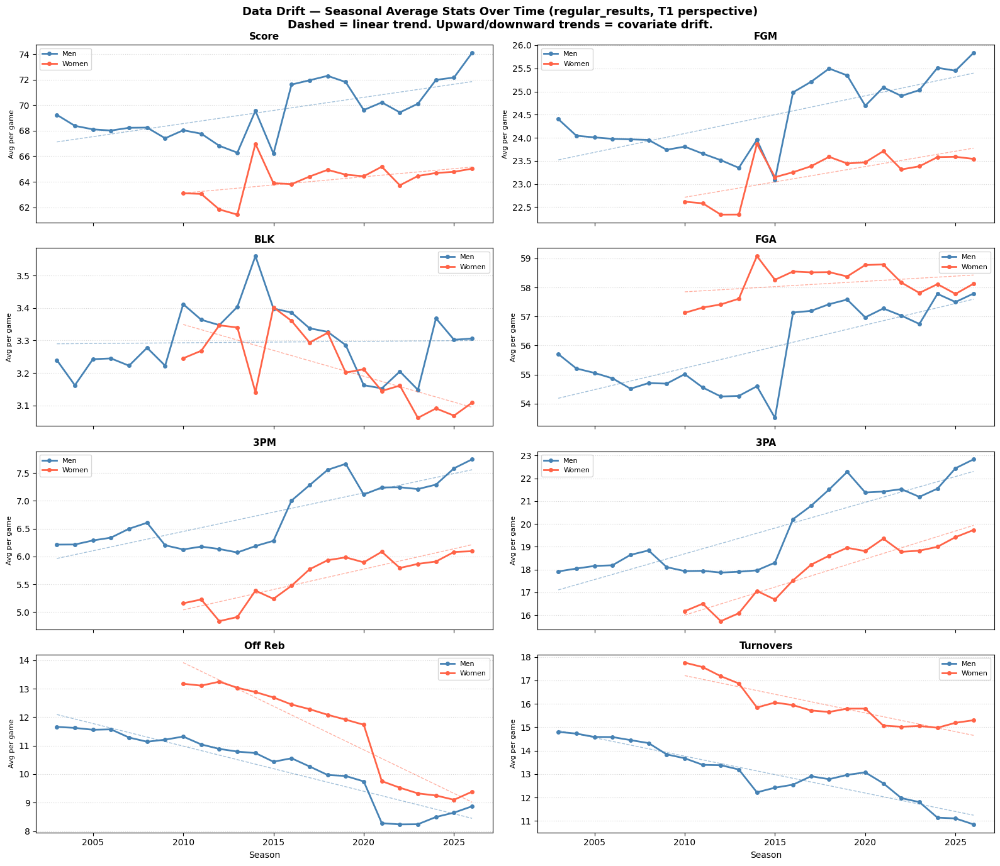

In [27]:
# ─── Covariate Drift: seasonal averages of key stats over time ──────────────
DRIFT_STATS = ['T1Score','T1FGM', 'T1Blk', 'T1FGA','T1FGM3', 'T1FGA3', 'T1OR', 'T1TO', 'T1Ast', 'T1Stl', 'T1PF']
SHORT_D     = ['Score','FGM','BLK', 'FGA', '3PM', '3PA', 'Off Reb', 'Turnovers', 'Assists', 'Steals', 'Fouls']

# Separate Men and Women — they have independent trends
cat_map    = {0: "Men", 1: "Women"}
cat_colors = {0: "steelblue", 1: "tomato"}

seasonal = (regular_results
            .groupby(['Season', 'Category'])[DRIFT_STATS]
            .mean()
            .reset_index())

fig, axes = plt.subplots(4, 2, figsize=(16, 14), sharex=True)

for ax, stat, short in zip(axes.flat, DRIFT_STATS, SHORT_D):
    for cat, grp in seasonal.groupby('Category'):
        grp = grp.sort_values('Season')
        ax.plot(grp['Season'], grp[stat],
                marker='o', markersize=4, lw=2,
                color=cat_colors[cat], label=cat_map[cat])
        # trend line
        import numpy as np
        m, b = np.polyfit(grp['Season'], grp[stat], 1)
        ax.plot(grp['Season'], m * grp['Season'] + b,
                '--', lw=1, color=cat_colors[cat], alpha=0.5)
    ax.set_title(short, fontsize=11, fontweight='bold')
    ax.set_ylabel('Avg per game', fontsize=8)
    ax.legend(fontsize=8)
    ax.grid(axis='y', linestyle=':', alpha=0.5)

axes.flat[-1].set_xlabel('Season', fontsize=10)
axes.flat[-2].set_xlabel('Season', fontsize=10)
fig.suptitle('Data Drift — Seasonal Average Stats Over Time (regular_results, T1 perspective)\n'
             'Dashed = linear trend. Upward/downward trends = covariate drift.',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()


## we can also plot per year change in a heatmap

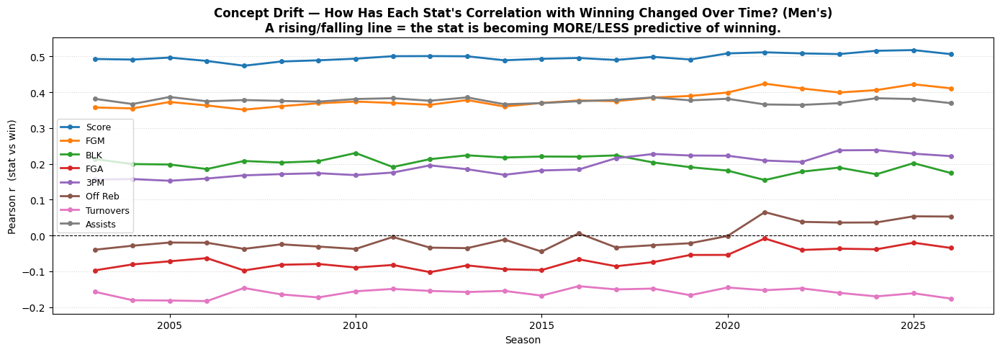

In [28]:
# ─── Concept Drift — does the stat→win relationship change across seasons? ───
# We check: is correlation between T1FGM3 (3PM) and winning growing over time?
# (The '3-point revolution' hypothesis)

CONCEPT_STATS = ['T1Score', 'T1FGM', 'T1Blk', 'T1FGA','T1FGM3', 'T1OR', 'T1TO', 'T1Ast']
SHORT_CONCEPT  = ['Score','FGM','BLK', 'FGA', '3PM', 'Off Reb', 'Turnovers', 'Assists']

regular_results['_win'] = (regular_results['Outcome'] == 'win').astype(int)

concept_corrs = []
for season, grp in regular_results[regular_results['Category'] == 0].groupby('Season'):
    row = {'Season': season}
    for stat in CONCEPT_STATS:
        row[stat] = grp[stat].corr(grp['_win'])
    concept_corrs.append(row)

concept_df = pd.DataFrame(concept_corrs).set_index('Season')
concept_df.columns = SHORT_CONCEPT

fig, ax = plt.subplots(figsize=(14, 5))
for col in concept_df.columns:
    ax.plot(concept_df.index, concept_df[col], marker='o', markersize=4, lw=2, label=col)

ax.axhline(0, color='black', lw=0.8, linestyle='--')
ax.set_xlabel('Season', fontsize=10)
ax.set_ylabel('Pearson r  (stat vs win)', fontsize=10)
ax.set_title("Concept Drift — How Has Each Stat's Correlation with Winning Changed Over Time? (Men's)\n"
             "A rising/falling line = the stat is becoming MORE/LESS predictive of winning.",
             fontsize=12, fontweight='bold')
ax.legend(fontsize=9)
ax.grid(axis='y', linestyle=':', alpha=0.5)
plt.tight_layout()
plt.show()


In [29]:
tourney_columns = ['Season', 'T1TeamID', 'T2TeamID', 'Outcome', 'ScoreDiff', 'Category']
tourney_results = tourney_results[tourney_columns]
tourney_results = tourney_results.merge(seeds_T1, 
                                       on=["Season", "T1TeamID"], 
                                       how="left").merge(seeds_T2, 
                                                         on=["Season", "T2TeamID"], 
                                                         how="left")
tourney_results["SeedDiff"] = tourney_results["T1Seed"] - tourney_results["T2Seed"]

### Basketball-specific per-game features:
Now we build basketball-specific features for each game!  

*Efficiency metrics*:
- Offensive efficiency  —> Points scored per offensive possession. (Score / Possession) * 100 
- Defensive efficiency  —> Points allowed per defensive possession. (Score / Possession) * 100 
- Net Efficiency        —> OE - DE
- Possessions           —> Number of times a team controls the ball and completes a sequence. FGA - OR + TO + (0.44 * FTA)  

*Shooting Metrics*:
- **Effective FG%** (eFG%)  —> (FGM + 0.5 * FGM3) / FGA (weights 3-pointers correctly)
- True Shooting% (TS%)  —> Score / (2 * (FGA + 0.44 * FTA))
- **Free throw rate**       —> FTM / FTA
- Draw fouls ability    —> FTA / FGA
- General shooting rates—> Made / Attempted

*Reboundings*:
- **Offensive rebounds** %  —> OR / (OR + Opp_DR)
- Defensive Rebound %   —> DR / (DR + Opp_OR)
- Total Rebound margin  —> OR - DR

*Team style*:
- **Turnover rate**           —> TO / Possessions
- Steal-to-Turnover       —> Stl / TO
- Assist-to-Turnover      —> Ast / TO  


**Stats** in bolds are **the four factors**: they explains most of the matches according to experts.  

Additionally, given the home-court advantage, we will compute an adjusted score that compensate for this with the data-driven values we computed during data exploration.

In [30]:
# home advantage is computed as (home_score_mean - away_score_mean)/2

LOCATION_ADJUSTED = {"H": -home_advantage,
                     "A": home_advantage,
                     "N": 0.0}

In [31]:
def compute_possessions(fga, or_, to, fta):
    return fga - or_ + to + 0.44 * fta

def build_per_game_features(df):
    df = df.copy()

    # adjusting the score based on location (additional feature)
    for team in ["T1", "T2"]:
        adj_points = df[f"{team}Loc"].map(LOCATION_ADJUSTED)
        df[f"{team}Score_adj"] = df[f"{team}Score"] + adj_points
    
        # computing possessions
        df[f"{team}Poss"] = compute_possessions(
            df[f"{team}FGA"], df[f"{team}OR"], df[f"{team}TO"], df[f"{team}FTA"]
        )

        # offensive efficiency
        df[f"{team}OE"] = (df[f"{team}Score_adj"] / df[f"{team}Poss"]) * 100

        # shooting metrics
        df[f"{team}eFG"] = (df[f"{team}FGM"] + 0.5 * df[f"{team}FGM3"]) / df[f"{team}FGA"] # 1 of the Four Factors
        df[f"{team}TS"] = df[f"{team}Score"] / (2 * (df[f"{team}FGA"] + 0.44 * df[f"{team}FTA"])) 
        df[f"{team}FT%"] = df[f"{team}FTM"] / df[f"{team}FTA"]
        df[f"{team}FTRate"] = df[f"{team}FTA"] / df[f"{team}FGA"] # 1 of the Four Factors
        df[f"{team}FG%"] = df[f"{team}FGM"] / df[f"{team}FGA"]
        df[f"{team}FG%3"] = df[f"{team}FGM3"] / df[f"{team}FGA3"]

        # team style
        df[f'{team}TORate']  = df[f'{team}TO']  / df[f'{team}Poss'] # 1 of the Four Factors
        df[f'{team}StlTORate'] = df[f'{team}Stl'] / (df[f'{team}TO'] + 1e-6)
        df[f'{team}AstTORate'] = df[f'{team}Ast'] / (df[f'{team}TO'] + 1e-6)

    # defensive efficiency
    df["T1DE"] = (df["T2Score_adj"] / df["T2Poss"]) * 100
    df["T2DE"] = (df["T1Score_adj"] / df["T1Poss"]) * 100

    # net efficiency
    df["T1NE"] = df["T1OE"] - df["T1DE"]
    df["T2NE"] = df["T2OE"] - df["T2DE"]

    # reboundings
    df['T1ORRate'] = df['T1OR'] / (df['T1OR'] + df['T2DR']) # 1 of the Four Factors
    df['T1DRRate'] = df['T1DR'] / (df['T1DR'] + df['T2OR']) # 1 of the Four Factors
    df['T2ORRate'] = df['T2OR'] / (df['T2OR'] + df['T1DR'])
    df['T2DRRate'] = df['T2DR'] / (df['T2DR'] + df['T1OR'])

    return df

In [32]:
regular_results_per_game_stats = build_per_game_features(regular_results)

## Elo Rating

The **Elo rating** is a method for quantifying the relative skill of teams. Each team starts at 1500 (hyperparameter) and is updated after every game:

$$r_{\text{new}} = r_{\text{old}} + K \cdot \text{MoV} \cdot (o - e)$$

- $o \in \{0, 1\}$: actual outcome  
- $e$: expected win probability derived from the rating gap  
- $K = 32$: update speed (hyperparameter)
- **MoV** (Margin of Victory multiplier): $\log(|\Delta\text{score}| + 1)$ — rewards convincing wins  

At the start of each new season ratings are **regressed 40 % toward the mean** to account for roster changes. The end-of-season rating is carried into the tournament as a feature.

In [33]:
INITIAL_ELO = 1500
K = 32
HOME_ADVANTAGE_ELO = 100   # ELO points bonus for home team; a team playing home is stronger than expected.
SEASON_REGRESSION = 0.4
MEAN_ELO = 1500

In [34]:
def expected_score(r1, r2, t1_loc):
    adj = {'H': HOME_ADVANTAGE_ELO, 'A': -HOME_ADVANTAGE_ELO, 'N': 0}[t1_loc]
    return 1 / (1 + 10 ** (-(r1 - r2 + adj) / 400))
 
def mov_multiplier(point_diff, elo_diff):
    """mov multiplier according to fivethirthyeight"""
    mov = np.log(abs(point_diff) + 1)
    return mov

In [35]:
def compute_elo(df):
    """
    Compute pre-game ELO ratings for every game.
    Returns df with T1_Elo_Before, T2_Elo_Before columns.
    Also returns final ELO dict per (Season, TeamID) for use as tournament features.
    """
    df = df.sort_values(['Season', 'DayNum']).reset_index(drop=True).copy()
    elo = {}
    season_end_elo = {}   # {(season, team_id): elo}
 
    t1_elo_before, t2_elo_before = [], []
    current_season = None
 
    for _, row in df.iterrows():
        t1, t2 = int(row['T1TeamID']), int(row['T2TeamID'])
        season = row['Season']
 
        # season transition: save end-of-season ratings, then regress to mean
        if season != current_season:
            if current_season is not None:
                for tid, rating in elo.items():
                    season_end_elo[(current_season, tid)] = rating
                    elo[tid] = MEAN_ELO + (rating - MEAN_ELO) * (1 - SEASON_REGRESSION)
            current_season = season
 
        r1 = elo.get(t1, INITIAL_ELO)
        r2 = elo.get(t2, INITIAL_ELO)
 
        t1_elo_before.append(r1)
        t2_elo_before.append(r2)
 
        e1 = expected_score(r1, r2, row['T1Loc'])
        e2 = 1 - e1
 
        o1 = 1 if row['Outcome'] == 'win' else 0
        o2 = 1 - o1
 
        winner_elo_diff = (r1 - r2) if o1 == 1 else (r2 - r1)
        multiplier = mov_multiplier(row['ScoreDiff'], winner_elo_diff)
 
        elo[t1] = r1 + K * multiplier * (o1 - e1)
        elo[t2] = r2 + K * multiplier * (o2 - e2)
 
    # save last season: this will be used as feature
    for tid, rating in elo.items():
        season_end_elo[(current_season, tid)] = rating
 
    df['T1_Elo_Before'] = t1_elo_before
    df['T2_Elo_Before'] = t2_elo_before
 
    return df, season_end_elo

In [36]:
regular_results_per_game_stats_with_elo, season_end_elo = compute_elo(regular_results_per_game_stats)


Detected 31 numeric T1 features.


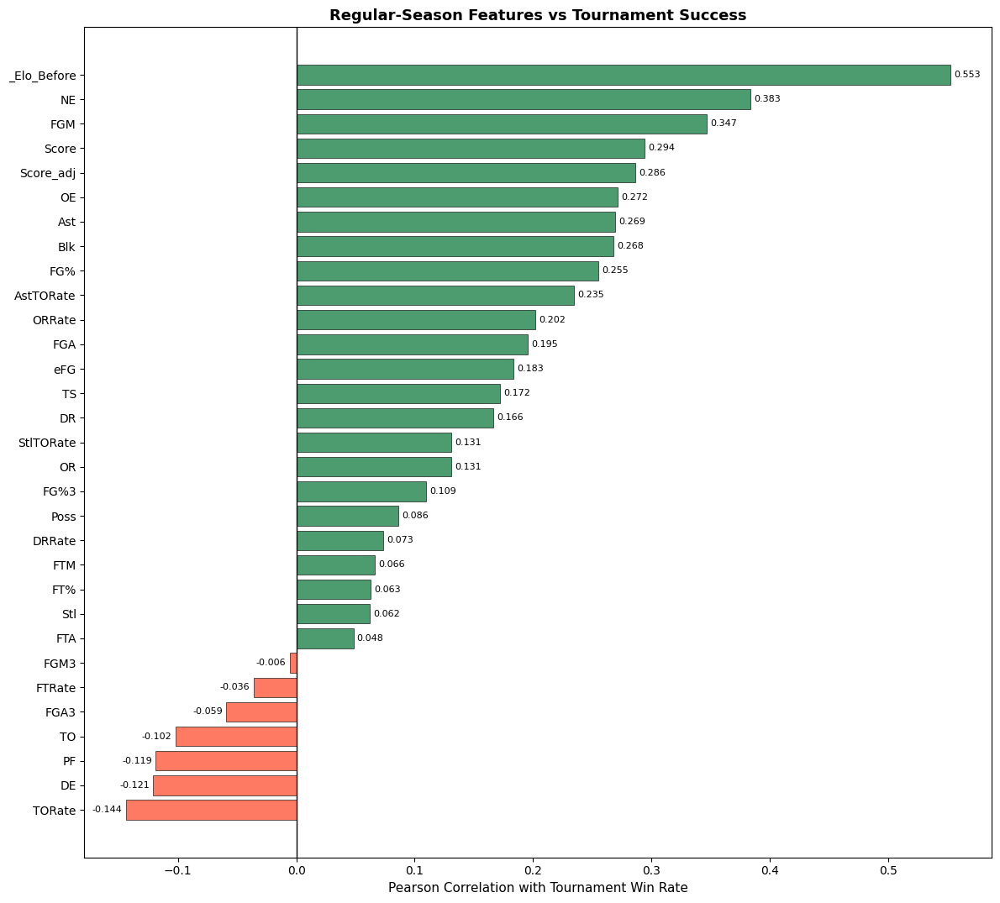


Top 10 POSITIVE predictors:
AstTORate      0.234562
FG%            0.254932
Blk            0.268275
Ast            0.269356
OE             0.271733
Score_adj      0.286312
Score          0.294024
FGM            0.347055
NE             0.383456
_Elo_Before    0.552698

Top 10 NEGATIVE predictors:
TORate   -0.144217
DE       -0.120935
PF       -0.118914
TO       -0.102329
FGA3     -0.059075
FTRate   -0.036172
FGM3     -0.005642
FTA       0.048209
Stl       0.062312
FT%       0.062988


In [96]:
corr_vals, merged_corr = analyze_all_feature_correlations(
    regular_results_per_game_stats_with_elo,
    tourney_results
)

### Aggregate features per season

We now aggregate all per-game statistics to obtain one row per *(Season, TeamID)*. This gives us the **average performance** of each team throughout the regular season against the average opponent, which is what we will use as input features for the tournament model (stats beginning with T1). Additionally, we will also have the average performance of an opponent against the team under analysis, which will be also used as input features (stats beginning with T2).

Two types of aggregated columns are produced:
- **Raw averages** — mean of each per-game stat (e.g. `T1_avg_Score`, `T1_avg_eFG`, `T1_Opponent_avg_Score`, `T1_Opponent_avg_eFG`)
- **Diff stats** — difference between T1 and T2 metrics within each game, then averaged (e.g. `T1_avg_NEDiff = mean(T1NE - T2NE)`)

In [37]:
DIFF_STATS = [ # stats for which we will compute differences
    'OE', 'DE', 'NE',
    'eFG', 'TS', 
    'ORRate', 'DRRate',
    'TORate', 'FTRate',
    'AstTORate', 'StlTORate', 
    'Score_adj'
]

AVG_STATS = [ # stats for which we will compute the average
    'T1Score', 'T2Score',
    'NumOT', 'T1FGM', 'T1FGA', 'T1FGM3', 'T1FGA3', 'T1FTM', 'T1FTA', 'T1OR',
    'T1DR', 'T1Ast', 'T1TO', 'T1Stl', 'T1Blk', 'T1PF', 'T2FGM', 'T2FGA',
    'T2FGM3', 'T2FGA3', 'T2FTM', 'T2FTA', 'T2OR', 'T2DR', 'T2Ast', 'T2TO',
    'T2Stl', 'T2Blk', 'T2PF', 'ScoreDiff', 'T1Score_adj', 'T1Poss', 'T1OE', 'T1eFG', 'T1TS', 'T1FT%',
    'T1FDA', 'T1FG%', 'T1FG%3', 'T1TORate', 'T1StlTORate', 'T1AstTORate',
    'T2Score_adj', 'T2Poss', 'T2OE', 'T2eFG', 'T2TS', 'T2FT%', 'T2FDA',
    'T2FG%', 'T2FG%3', 'T2TORate', 'T2StlTORate', 'T2AstTORate', 'T1DE',
    'T2DE', 'T1NE', 'T2NE', 'T1ORRate', 'T1DRRate', 'T2ORRate', 'T2DRRate']

def compute_diff_stats(df):
    """
    Compute per-game diff stats.
    """
    df = df.copy()
    for feature in DIFF_STATS:
        df[f"T1{feature}Diff"] = df[f"T1{feature}"] - df[f"T2{feature}"] # we compute the diff featuers in the POV of T1.

    return df

def aggregate_team_season(df):
    """
    Aggregate per-game stats to one row per (Season, TeamID).
    """
    columns_to_average = list(set(df.columns) - {'Category','DayNum','Outcome','Season','T1Loc','T1TeamID','T2Loc','T2TeamID'})
    df = df.copy().groupby(["Season", "T1TeamID"])[columns_to_average].mean().reset_index()
    return df
    
def create_features(results_df, tourney_df):
    df_T1 = results_df.copy()
    df_T2 = results_df.copy()
    features_df = tourney_df.copy()
    df_T1.columns = ["T1_avg_" + c.replace("T1","").replace("T2","Opponent_") for c in df_T1.columns]
    df_T1.rename(columns={"T1_avg_Season": "Season", "T1_avg_TeamID": "T1TeamID"}, inplace=True)
    df_T2.columns = ["T2_avg_" + c.replace("T1","").replace("T2","Opponent_") for c in df_T2.columns]
    df_T2.rename(columns={"T2_avg_Season": "Season", "T2_avg_TeamID": "T2TeamID"}, inplace=True)
    
    features_df = pd.merge(features_df, df_T1, on=["Season", "T1TeamID"], how="left")
    features_df = pd.merge(features_df, df_T2, on=["Season", "T2TeamID"], how="left")

    return features_df


In [38]:
tourney_results_with_features = create_features(
    aggregate_team_season(
        compute_diff_stats(regular_results_per_game_stats_with_elo)
        ), tourney_results)

For the Elo feature, we do not want to use the average throughout the season, but the Elo at the end of the season.  
Let's correct Elo values to the last of the regular season, and let's compute the diff and the elo_win_probability as features!

In [39]:
tourney_results_with_features["T1_Elo"] = tourney_results_with_features.apply(
        lambda r: season_end_elo.get((r['Season'], int(r['T1TeamID'])), INITIAL_ELO), axis=1
    )

tourney_results_with_features["T2_Elo"] = tourney_results_with_features.apply(
        lambda r: season_end_elo.get((r['Season'], int(r['T2TeamID'])), INITIAL_ELO), axis=1
    )

tourney_results_with_features["EloDiff"] = tourney_results_with_features["T1_Elo"] - tourney_results_with_features["T2_Elo"]
tourney_results_with_features['elo_win_prob'] = 1 / (1 + 10 ** (-tourney_results_with_features['EloDiff'] / 400))

tourney_results_with_features.drop(columns=[
    'T1_avg__Elo_Before',
    'T1_avg_Opponent__Elo_Before',
    'T2_avg__Elo_Before',
    'T2_avg_Opponent__Elo_Before',],
    inplace=True) # we do not need those features!


Detected 78 numeric T1 features.


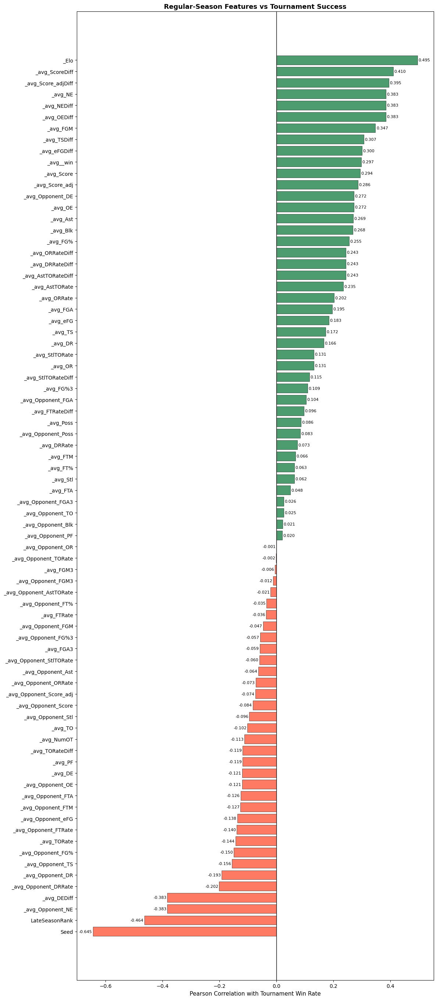


Top 10 POSITIVE predictors:
_avg__win             0.297165
_avg_eFGDiff          0.299700
_avg_TSDiff           0.306644
_avg_FGM              0.347055
_avg_OEDiff           0.383456
_avg_NEDiff           0.383456
_avg_NE               0.383456
_avg_Score_adjDiff    0.394780
_avg_ScoreDiff        0.409986
_Elo                  0.494685

Top 10 NEGATIVE predictors:
Seed                   -0.644829
LateSeasonRank         -0.463750
_avg_Opponent_NE       -0.383456
_avg_DEDiff            -0.383456
_avg_Opponent_DRRate   -0.201628
_avg_Opponent_DR       -0.192693
_avg_Opponent_TS       -0.156379
_avg_Opponent_FG%      -0.149829
_avg_TORate            -0.144217
_avg_Opponent_FTRate   -0.139615


In [97]:
corr_vals, merged_corr = analyze_all_feature_correlations(
    tourney_results_with_features,
    tourney_results
)

### LateSeasonRank regression for Women
We have ordinal rankings for Men competition only. We will try to do regression on this feature for Men and compute it for Women.  

Let's extract the mean of the last 5 games and use it as a feature explaining the late season ranking (a team might get better/worse throughout a season!)

In [40]:
grouped_ordinals = M_massey_ordinals_df.groupby(["Season","TeamID","RankingDayNum"])["OrdinalRank"].mean().reset_index()

M_ordinals = pd.DataFrame(columns=["Season","TeamID","LateSeasonRank"])
seasons, team_ids, late_season_ranks = [],[],[]
for season in grouped_ordinals["Season"].unique():
    for team_id in grouped_ordinals[grouped_ordinals["Season"]==season]["TeamID"].unique():
        seasons.append(season)
        team_ids.append(team_id)
        late_season_ranks.append(
            grouped_ordinals[(grouped_ordinals["Season"]==season) & (grouped_ordinals["TeamID"]==team_id)]["OrdinalRank"][-5:].mean()
        )

M_ordinals["Season"] = seasons
M_ordinals["TeamID"] = team_ids
M_ordinals["LateSeasonRank"] = late_season_ranks

M_ordinals

,Season,TeamID,LateSeasonRank
0,2003,1102,158.939583
1,2003,1103,166.284848
2,2003,1104,34.591098
3,2003,1105,306.896780
4,2003,1106,247.079924
...,...,...,...
8351,2026,1477,297.716755
8352,2026,1478,297.588690
8353,2026,1479,289.077499
8354,2026,1480,291.901605


Let's select some features for regressing LateSeasonRank (Four Factors!)

In [41]:
features_for_regression = [
'T1Seed',
'T1_avg_Score',
# 'T1_avg_Blk',
# 'T1_avg_AstTORate',
'T1_avg_FTRate',
# 'T1_avg_FTM',
# 'T1_avg_Stl',
# 'T1_avg_FG%3',
'T1_avg_eFG',
# 'T1_avg_FGM3',
'T1_avg_DRRate',
# 'T1_avg_Score_adj',
'T1_avg_NE',
# 'T1_avg_NumOT',
# 'T1_avg_Ast',
# 'T1_avg_OR',
# 'T1_avg_OE',
# 'T1_avg_FGA3',
# 'T1_avg_Poss',
# 'T1_avg_PF',
# 'T1_avg_FTA',
# 'T1_avg_FT%',
# 'T1_avg_FGA',
# 'T1_avg_TS',
# 'T1_avg_StlTORate',
'T1_avg_TORate',
# 'T1_avg_DE',
# 'T1_avg_FG%',
# 'T1_avg_FGM',
'T1_avg_ORRate',
'T1_Elo']

In [42]:
tourney_results_with_regression_features = tourney_results_with_features[['Season','T1TeamID'] + features_for_regression]

In [43]:
# tourney_results_with_regression_features has one row per match per team.
# since we only kept T1 features, matches for the same team are duplicates. we will drop them.

M_tourney_results_with_regression_features = tourney_results_with_regression_features.loc[tourney_results_with_features["Category"]==0].drop_duplicates()
W_tourney_results_with_regression_features = tourney_results_with_regression_features.loc[tourney_results_with_features["Category"]==1].drop_duplicates()
M_tourney_results_with_regression_features = M_tourney_results_with_regression_features.merge(M_ordinals.rename(columns={"TeamID": "T1TeamID", "LateSeasonRank": "T1LateSeasonRank"}), 
                                       on=["Season", "T1TeamID"], 
                                       how="left")


### Model for regression
We use a simple Ridge regression since it tends to work quite good.

**NOTE FOR SHARIQ, YOU MIGHT INVESTIGATE THIS**
- try other models, looking at the scores.mean() produced. the lower, the better! additionally, look at the feature distribution below. the closer men's and women's distribution are, the better it is. To be honest, i am already satisfied with this model but if you have any idea just try. BE CAREFUL WITH OVERFITTING! EXTRA COMPLEX MODELS/FEATURES ARE NOT NEEDED (OCCAM'S RAZOR) 

In [44]:
from sklearn.linear_model import Ridge
from sklearn.compose import TransformedTargetRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score

regression_target = "T1LateSeasonRank"

X_train = M_tourney_results_with_regression_features.copy().drop(columns=regression_target)
y_train = M_tourney_results_with_regression_features[regression_target]


models = [
    Ridge(alpha=1.0),
    # other models?
]


# Fit and predict
model = Pipeline([
    ('scaler', StandardScaler()),
    ('reg', models[0]),
])

model_log = TransformedTargetRegressor(regressor=model, func=np.log, inverse_func=np.exp)

model_log.fit(X_train, y_train) # for skewed distributions, log models tends to work better!

X_pred = W_tourney_results_with_regression_features.copy().drop_duplicates()
y_pred = model_log.predict(X_pred).clip(min=min(y_train), max=max(y_train))

scores = cross_val_score(model_log, X_train, y_train, cv=5, scoring='neg_root_mean_squared_error')
print(scores.mean())

-15.511105891271603


In [45]:

from sklearn.ensemble import  GradientBoostingRegressor

regression_target = "T1LateSeasonRank"

X_train = M_tourney_results_with_regression_features.copy().drop(columns=regression_target)
y_train = M_tourney_results_with_regression_features[regression_target]




# Fit and predict
model = GradientBoostingRegressor(n_estimators=100, max_depth=3, random_state=42)

model_log = TransformedTargetRegressor(regressor=model, func=np.log, inverse_func=np.exp)

model_log.fit(X_train, y_train) # for skewed distributions, log models tends to work better!

X_pred = W_tourney_results_with_regression_features.copy().drop_duplicates()
y_pred = model_log.predict(X_pred).clip(min=min(y_train), max=max(y_train))

scores = cross_val_score(model_log, X_train, y_train, cv=5, scoring='neg_root_mean_squared_error')
print(scores.mean())

-12.651300607871628


The skewed distribution of Women Late Season Rank is very similar to the Men's one. Nice!

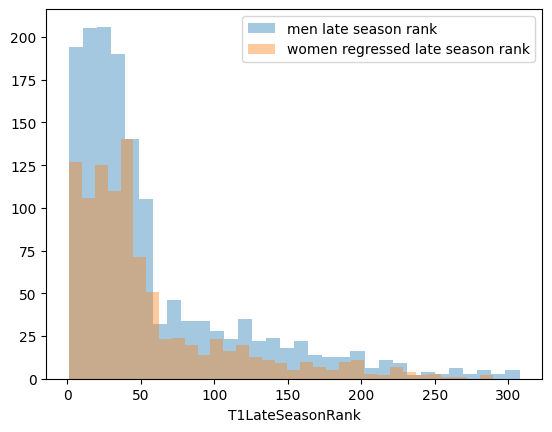

In [46]:
seaborn.distplot(y_train, label="men late season rank", kde=False)
seaborn.distplot(y_pred, label="women regressed late season rank", kde=False)
plt.legend()
plt.show()

pred with gboost

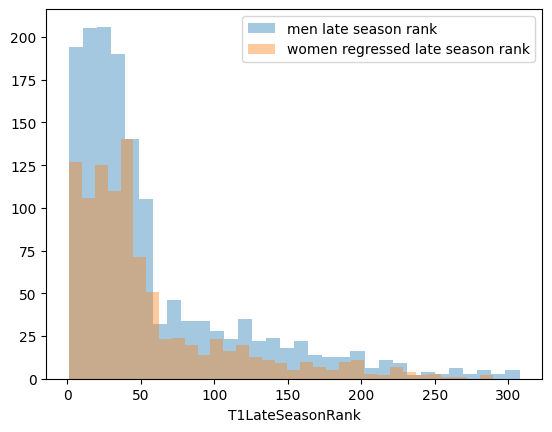

In [47]:
seaborn.distplot(y_train, label="men late season rank", kde=False)
seaborn.distplot(y_pred, label="women regressed late season rank", kde=False)
plt.legend()
plt.show()

Let's add the predicted late season rank

In [48]:
W_tourney_results_with_regression_features[regression_target] = y_pred

In [49]:
ordinals_regression_features = pd.concat([
    M_tourney_results_with_regression_features,
    W_tourney_results_with_regression_features
    ])[["Season","T1TeamID","T1LateSeasonRank"]]

ordinals_regression_features_T1 = ordinals_regression_features.copy()
ordinals_regression_features_T2 = ordinals_regression_features.copy()
ordinals_regression_features_T2.columns = [col.replace("T1", "T2") for col in ordinals_regression_features_T1.columns]

tourney_results_with_features = tourney_results_with_features.merge(ordinals_regression_features_T1,  
                                    on=["Season", "T1TeamID"], how="left").merge(ordinals_regression_features_T2,  
                                    on=["Season", "T2TeamID"], how="left")

tourney_results_with_features["LateSeasonRankDiff"] = tourney_results_with_features["T1LateSeasonRank"] - tourney_results_with_features["T2LateSeasonRank"]

### Features selection:
We build several features to use for predicting the outcomes. Which one are the best?

In [50]:
all_features =  [
# 'Season',
# 'T1TeamID',
# 'T2TeamID',
# 'Outcome',
# 'ScoreDiff',
'Category',
'T1Seed',
'T2Seed',
'SeedDiff',
'T1LateSeasonRank',
'T2LateSeasonRank',
'LateSeasonRankDiff',
'T1_avg_FT%',
'T1_avg_TORate',
'T1_avg_Opponent_ORRate',
'T1_avg_FGA3',
'T1_avg_Opponent_FGM3',
'T1_avg_Opponent_Score',
'T1_avg_Opponent_Blk',
'T1_avg_FTM',
'T1_avg_ORRate',
'T1_avg_Opponent_Poss',
'T1_avg_FTRate',
'T1_avg_PF',
'T1_avg_eFGDiff',
'T1_avg_Opponent_NE',
'T1_avg_Poss',
'T1_avg_Opponent_TO',
'T1_avg_Opponent_DE',
'T1_avg_Opponent_FTM',
'T1_avg_Opponent_StlTORate',
'T1_avg_Opponent_DRRate',
'T1_avg_eFG',
'T1_avg_Opponent_OR',
'T1_avg_TSDiff',
'T1_avg_Opponent_OE',
# 'T1_avg_NumOT',
'T1_avg_Opponent_eFG',
'T1_avg_Opponent_FTRate',
'T1_avg_FGA',
'T1_avg_Opponent_FG%',
'T1_avg_FGM',
'T1_avg_FGM3',
'T1_avg_TORateDiff',
'T1_avg_Opponent_DR',
'T1_avg_Opponent_FGM',
'T1_avg_NEDiff',
'T1_avg_Opponent_FTA',
'T1_avg_TO',
'T1_avg_Opponent_Ast',
'T1_avg_StlTORate',
'T1_avg_OE',
'T1_avg_FG%3',
'T1_avg_AstTORate',
'T1_avg_AstTORateDiff',
'T1_avg_Score_adj',
'T1_avg_FTA',
'T1_avg_Opponent_TORate',
'T1_avg_Stl',
'T1_avg_Opponent_Stl',
'T1_avg_Opponent_FG%3',
'T1_avg_DR',
'T1_avg_ORRateDiff',
'T1_avg_Score',
'T1_avg_Opponent_FGA',
'T1_avg_Opponent_FT%',
'T1_avg_Score_adjDiff',
'T1_avg_OR',
'T1_avg_Opponent_AstTORate',
'T1_avg_OEDiff',
'T1_avg_DRRateDiff',
'T1_avg_ScoreDiff',
'T1_avg_NE',
'T1_avg_StlTORateDiff',
'T1_avg_Opponent_TS',
'T1_avg_FG%',
'T1_avg_Opponent_Score_adj',
'T1_avg_DRRate',
'T1_avg_Blk',
'T1_avg_Opponent_PF',
'T1_avg_Opponent_FGA3',
'T1_avg_FTRateDiff',
'T1_avg_DEDiff',
'T1_avg_Ast',
'T1_avg_DE',
'T1_avg_TS',
'T2_avg_FT%',
'T2_avg_TORate',
'T2_avg_Opponent_ORRate',
'T2_avg_FGA3',
'T2_avg_Opponent_FGM3',
'T2_avg_Opponent_Score',
'T2_avg_Opponent_Blk',
'T2_avg_FTM',
'T2_avg_ORRate',
'T2_avg_Opponent_Poss',
'T2_avg_FTRate',
'T2_avg_PF',
'T2_avg_eFGDiff',
'T2_avg_Opponent_NE',
'T2_avg_Poss',
'T2_avg_Opponent_TO',
'T2_avg_Opponent_DE',
'T2_avg_Opponent_FTM',
'T2_avg_Opponent_StlTORate',
'T2_avg_Opponent_DRRate',
'T2_avg_eFG',
'T2_avg_Opponent_OR',
'T2_avg_TSDiff',
'T2_avg_Opponent_OE',
# 'T2_avg_NumOT',
'T2_avg_Opponent_eFG',
'T2_avg_Opponent_FTRate',
'T2_avg_FGA',
'T2_avg_Opponent_FG%',
'T2_avg_FGM',
'T2_avg_FGM3',
'T2_avg_TORateDiff',
'T2_avg_Opponent_DR',
'T2_avg_Opponent_FGM',
'T2_avg_NEDiff',
'T2_avg_Opponent_FTA',
'T2_avg_TO',
'T2_avg_Opponent_Ast',
'T2_avg_StlTORate',
'T2_avg_OE',
'T2_avg_FG%3',
'T2_avg_AstTORate',
'T2_avg_AstTORateDiff',
'T2_avg_Score_adj',
'T2_avg_FTA',
'T2_avg_Opponent_TORate',
'T2_avg_Stl',
'T2_avg_Opponent_Stl',
'T2_avg_Opponent_FG%3',
'T2_avg_DR',
'T2_avg_ORRateDiff',
'T2_avg_Score',
'T2_avg_Opponent_FGA',
'T2_avg_Opponent_FT%',
'T2_avg_Score_adjDiff',
'T2_avg_OR',
'T2_avg_Opponent_AstTORate',
'T2_avg_OEDiff',
'T2_avg_DRRateDiff',
'T2_avg_ScoreDiff',
'T2_avg_NE',
'T2_avg_StlTORateDiff',
'T2_avg_Opponent_TS',
'T2_avg_FG%',
'T2_avg_Opponent_Score_adj',
'T2_avg_DRRate',
'T2_avg_Blk',
'T2_avg_Opponent_PF',
'T2_avg_Opponent_FGA3',
'T2_avg_FTRateDiff',
'T2_avg_DEDiff',
'T2_avg_Ast',
'T2_avg_DE',
'T2_avg_TS',
'T1_Elo',
'T2_Elo',
'EloDiff',
'elo_win_prob']

pred = "ScoreDiff"

In [51]:
only_diff_features =  [
# 'Season',
# 'T1TeamID',
# 'T2TeamID',
# 'Outcome',
# 'ScoreDiff',
'Category',
# 'T1Seed',
# 'T2Seed',
'SeedDiff',
# 'T1LateSeasonRank',
# 'T2LateSeasonRank',
'LateSeasonRankDiff',
# 'T1_avg_FT%',
# 'T1_avg_TORate',
# 'T1_avg_Opponent__Elo_Before',
# 'T1_avg_Opponent_ORRate',
# 'T1_avg_FGA3',
# 'T1_avg_Opponent_FGM3',
# 'T1_avg_Opponent_Score',
# 'T1_avg_Opponent_Blk',
# 'T1_avg_FTM',
# 'T1_avg_ORRate',
# 'T1_avg_Opponent_Poss',
# 'T1_avg_FTRate',
# 'T1_avg_PF',
# 'T1_avg__Elo_Before',
'T1_avg_eFGDiff',
# 'T1_avg_Opponent_NE',
# 'T1_avg_Poss',
# 'T1_avg_Opponent_TO',
# 'T1_avg_Opponent_DE',
# 'T1_avg_Opponent_FTM',
# 'T1_avg_Opponent_StlTORate',
# 'T1_avg_Opponent_DRRate',
# 'T1_avg_eFG',
# 'T1_avg_Opponent_OR',
'T1_avg_TSDiff',
# 'T1_avg_Opponent_OE',
# 'T1_avg_NumOT',
# 'T1_avg_Opponent_eFG',
# 'T1_avg_Opponent_FTRate',
# 'T1_avg_FGA',
# 'T1_avg_Opponent_FG%',
# 'T1_avg_FGM',
# 'T1_avg_FGM3',
'T1_avg_TORateDiff',
# 'T1_avg_Opponent_DR',
# 'T1_avg_Opponent_FGM',
'T1_avg_NEDiff',
# 'T1_avg_Opponent_FTA',
# 'T1_avg_TO',
# 'T1_avg_Opponent_Ast',
# 'T1_avg_StlTORate',
# 'T1_avg_OE',
# 'T1_avg_FG%3',
# 'T1_avg_AstTORate',
'T1_avg_AstTORateDiff',
# 'T1_avg_Score_adj',
# 'T1_avg_FTA',
# 'T1_avg_Opponent_TORate',
# 'T1_avg_Stl',
# 'T1_avg_Opponent_Stl',
# 'T1_avg_Opponent_FG%3',
# 'T1_avg_DR',
'T1_avg_ORRateDiff',
# 'T1_avg_Score',
# 'T1_avg_Opponent_FGA',
# 'T1_avg_Opponent_FT%',
'T1_avg_Score_adjDiff',
# 'T1_avg_OR',
# 'T1_avg_Opponent_AstTORate',
'T1_avg_OEDiff',
'T1_avg_DRRateDiff',
'T1_avg_ScoreDiff',
# 'T1_avg_NE',
'T1_avg_StlTORateDiff',
# 'T1_avg_Opponent_TS',
# 'T1_avg_FG%',
# 'T1_avg_Opponent_Score_adj',
# 'T1_avg_DRRate',
# 'T1_avg_Blk',
# 'T1_avg_Opponent_PF',
# 'T1_avg_Opponent_FGA3',
'T1_avg_FTRateDiff',
'T1_avg_DEDiff',
# 'T1_avg_Ast',
# 'T1_avg_DE',
# 'T1_avg_TS',
# 'T2_avg_FT%',
# 'T2_avg_TORate',
# 'T2_avg_Opponent__Elo_Before',
# 'T2_avg_Opponent_ORRate',
# 'T2_avg_FGA3',
# 'T2_avg_Opponent_FGM3',
# 'T2_avg_Opponent_Score',
# 'T2_avg_Opponent_Blk',
# 'T2_avg_FTM',
# 'T2_avg_ORRate',
# 'T2_avg_Opponent_Poss',
# 'T2_avg_FTRate',
# 'T2_avg_PF',
# 'T2_avg__Elo_Before',
'T2_avg_eFGDiff',
# 'T2_avg_Opponent_NE',
# 'T2_avg_Poss',
# 'T2_avg_Opponent_TO',
# 'T2_avg_Opponent_DE',
# 'T2_avg_Opponent_FTM',
# 'T2_avg_Opponent_StlTORate',
# 'T2_avg_Opponent_DRRate',
# 'T2_avg_eFG',
# 'T2_avg_Opponent_OR',
'T2_avg_TSDiff',
# 'T2_avg_Opponent_OE',
# 'T2_avg_NumOT',
# 'T2_avg_Opponent_eFG',
# 'T2_avg_Opponent_FTRate',
# 'T2_avg_FGA',
# 'T2_avg_Opponent_FG%',
# 'T2_avg_FGM',
# 'T2_avg_FGM3',
'T2_avg_TORateDiff',
# 'T2_avg_Opponent_DR',
# 'T2_avg_Opponent_FGM',
'T2_avg_NEDiff',
# 'T2_avg_Opponent_FTA',
# 'T2_avg_TO',
# 'T2_avg_Opponent_Ast',
# 'T2_avg_StlTORate',
# 'T2_avg_OE',
# 'T2_avg_FG%3',
# 'T2_avg_AstTORate',
'T2_avg_AstTORateDiff',
# 'T2_avg_Score_adj',
# 'T2_avg_FTA',
# 'T2_avg_Opponent_TORate',
# 'T2_avg_Stl',
# 'T2_avg_Opponent_Stl',
# 'T2_avg_Opponent_FG%3',
# 'T2_avg_DR',
'T2_avg_ORRateDiff',
# 'T2_avg_Score',
# 'T2_avg_Opponent_FGA',
# 'T2_avg_Opponent_FT%',
'T2_avg_Score_adjDiff',
# 'T2_avg_OR',
# 'T2_avg_Opponent_AstTORate',
'T2_avg_OEDiff',
'T2_avg_DRRateDiff',
'T2_avg_ScoreDiff',
# 'T2_avg_NE',
'T2_avg_StlTORateDiff',
# 'T2_avg_Opponent_TS',
# 'T2_avg_FG%',
# 'T2_avg_Opponent_Score_adj',
# 'T2_avg_DRRate',
# 'T2_avg_Blk',
# 'T2_avg_Opponent_PF',
# 'T2_avg_Opponent_FGA3',
'T2_avg_FTRateDiff',
'T2_avg_DEDiff',
# 'T2_avg_Ast',
# 'T2_avg_DE',
# 'T2_avg_TS',
# 'T1_Elo',
# 'T2_Elo',
'EloDiff',
# 'elo_win_prob'
]

In [52]:
minimal_raw_boxscore_features =  [
# 'Season',
# 'T1TeamID',
# 'T2TeamID',
# 'Outcome',
# 'ScoreDiff',
'Category',
'T1Seed',
'T2Seed',
'SeedDiff',
'T1LateSeasonRank',
'T2LateSeasonRank',
'LateSeasonRankDiff',
# 'T1_avg_FT%',
# 'T1_avg_TORate',
# 'T1_avg_Opponent__Elo_Before',
# 'T1_avg_Opponent_ORRate',
'T1_avg_FGA3',
'T1_avg_Opponent_FGM3',
'T1_avg_Opponent_Score',
'T1_avg_Opponent_Blk',
'T1_avg_FTM',
# 'T1_avg_ORRate',
# 'T1_avg_Opponent_Poss',
# 'T1_avg_FTRate',
'T1_avg_PF',
# 'T1_avg__Elo_Before',
# 'T1_avg_eFGDiff',
# 'T1_avg_Opponent_NE',
# 'T1_avg_Poss',
'T1_avg_Opponent_TO',
# 'T1_avg_Opponent_DE',
'T1_avg_Opponent_FTM',
# 'T1_avg_Opponent_StlTORate',
# 'T1_avg_Opponent_DRRate',
# 'T1_avg_eFG',
'T1_avg_Opponent_OR',
# 'T1_avg_TSDiff',
# 'T1_avg_Opponent_OE',
# 'T1_avg_NumOT',
# 'T1_avg_Opponent_eFG',
# 'T1_avg_Opponent_FTRate',
'T1_avg_FGA',
# 'T1_avg_Opponent_FG%',
'T1_avg_FGM',
'T1_avg_FGM3',
# 'T1_avg_TORateDiff',
'T1_avg_Opponent_DR',
'T1_avg_Opponent_FGM',
'T1_avg_NEDiff',
'T1_avg_Opponent_FTA',
'T1_avg_TO',
'T1_avg_Opponent_Ast',
# 'T1_avg_StlTORate',
# 'T1_avg_OE',
# 'T1_avg_FG%3',
# 'T1_avg_AstTORate',
# 'T1_avg_AstTORateDiff',
# 'T1_avg_Score_adj',
'T1_avg_FTA',
# 'T1_avg_Opponent_TORate',
'T1_avg_Stl',
'T1_avg_Opponent_Stl',
# 'T1_avg_Opponent_FG%3',
'T1_avg_DR',
# 'T1_avg_ORRateDiff',
'T1_avg_Score',
'T1_avg_Opponent_FGA',
# 'T1_avg_Opponent_FT%',
# 'T1_avg_Score_adjDiff',
'T1_avg_OR',
# 'T1_avg_Opponent_AstTORate',
# 'T1_avg_OEDiff',
# 'T1_avg_DRRateDiff',
# 'T1_avg_ScoreDiff',
# 'T1_avg_NE',
# 'T1_avg_StlTORateDiff',
# 'T1_avg_Opponent_TS',
# 'T1_avg_FG%',
# 'T1_avg_Opponent_Score_adj',
# 'T1_avg_DRRate',
'T1_avg_Blk',
'T1_avg_Opponent_PF',
'T1_avg_Opponent_FGA3',
# 'T1_avg_FTRateDiff',
# 'T1_avg_DEDiff',
'T1_avg_Ast',
# 'T1_avg_DE',
# 'T1_avg_TS',
# 'T2_avg_FT%',
# 'T2_avg_TORate',
# 'T2_avg_Opponent__Elo_Before',
# 'T2_avg_Opponent_ORRate',
'T2_avg_FGA3',
'T2_avg_Opponent_FGM3',
'T2_avg_Opponent_Score',
'T2_avg_Opponent_Blk',
'T2_avg_FTM',
# 'T2_avg_ORRate',
# 'T2_avg_Opponent_Poss',
# 'T2_avg_FTRate',
'T2_avg_PF',
# 'T2_avg__Elo_Before',
# 'T2_avg_eFGDiff',
# 'T2_avg_Opponent_NE',
# 'T2_avg_Poss',
'T2_avg_Opponent_TO',
# 'T2_avg_Opponent_DE',
'T2_avg_Opponent_FTM',
# 'T2_avg_Opponent_StlTORate',
# 'T2_avg_Opponent_DRRate',
# 'T2_avg_eFG',
'T2_avg_Opponent_OR',
# 'T2_avg_TSDiff',
# 'T2_avg_Opponent_OE',
# 'T2_avg_NumOT',
# 'T2_avg_Opponent_eFG',
# 'T2_avg_Opponent_FTRate',
'T2_avg_FGA',
# 'T2_avg_Opponent_FG%',
'T2_avg_FGM',
'T2_avg_FGM3',
# 'T2_avg_TORateDiff',
'T2_avg_Opponent_DR',
'T2_avg_Opponent_FGM',
# 'T2_avg_NEDiff',
'T2_avg_Opponent_FTA',
'T2_avg_TO',
'T2_avg_Opponent_Ast',
# 'T2_avg_StlTORate',
# 'T2_avg_OE',
# 'T2_avg_FG%3',
# 'T2_avg_AstTORate',
# 'T2_avg_AstTORateDiff',
# 'T2_avg_Score_adj',
'T2_avg_FTA',
# 'T2_avg_Opponent_TORate',
'T2_avg_Stl',
'T2_avg_Opponent_Stl',
# 'T2_avg_Opponent_FG%3',
'T2_avg_DR',
# 'T2_avg_ORRateDiff',
'T2_avg_Score',
'T2_avg_Opponent_FGA',
# 'T2_avg_Opponent_FT%',
# 'T2_avg_Score_adjDiff',
'T2_avg_OR',
# 'T2_avg_Opponent_AstTORate',
# 'T2_avg_OEDiff',
# 'T2_avg_DRRateDiff',
# 'T2_avg_ScoreDiff',
# 'T2_avg_NE',
# 'T2_avg_StlTORateDiff',
# 'T2_avg_Opponent_TS',
# 'T2_avg_FG%',
# 'T2_avg_Opponent_Score_adj',
# 'T2_avg_DRRate',
'T2_avg_Blk',
'T2_avg_Opponent_PF',
'T2_avg_Opponent_FGA3',
# 'T2_avg_FTRateDiff',
# 'T2_avg_DEDiff',
'T2_avg_Ast',
# 'T2_avg_DE',
# 'T2_avg_TS',
'T1_Elo',
'T2_Elo',
'EloDiff',
'elo_win_prob']

pred = "ScoreDiff"

In [53]:
minimal_raw_features =  [
# 'Season',
# 'T1TeamID',
# 'T2TeamID',
# 'Outcome',
# 'ScoreDiff',
'Category',
'T1Seed',
'T2Seed',
'SeedDiff',
'T1LateSeasonRank',
'T2LateSeasonRank',
'LateSeasonRankDiff',
# 'T1_avg_FT%',
# 'T1_avg_TORate',
# 'T1_avg_Opponent__Elo_Before',
# 'T1_avg_Opponent_ORRate',
# 'T1_avg_FGA3',
# 'T1_avg_Opponent_FGM3',
# 'T1_avg_Opponent_Score',
# 'T1_avg_Opponent_Blk',
# 'T1_avg_FTM',
# 'T1_avg_ORRate',
# 'T1_avg_Opponent_Poss',
# 'T1_avg_FTRate',
# 'T1_avg_PF',
# 'T1_avg__Elo_Before',
# 'T1_avg_eFGDiff',
# 'T1_avg_Opponent_NE',
# 'T1_avg_Poss',
# 'T1_avg_Opponent_TO',
# 'T1_avg_Opponent_DE',
# 'T1_avg_Opponent_FTM',
# 'T1_avg_Opponent_StlTORate',
# 'T1_avg_Opponent_DRRate',
# 'T1_avg_eFG',
# 'T1_avg_Opponent_OR',
# 'T1_avg_TSDiff',
# 'T1_avg_Opponent_OE',
# 'T1_avg_NumOT',
# 'T1_avg_Opponent_eFG',
# 'T1_avg_Opponent_FTRate',
# 'T1_avg_FGA',
# 'T1_avg_Opponent_FG%',
# 'T1_avg_FGM',
# 'T1_avg_FGM3',
# 'T1_avg_TORateDiff',
# 'T1_avg_Opponent_DR',
# 'T1_avg_Opponent_FGM',
# 'T1_avg_NEDiff',
# 'T1_avg_Opponent_FTA',
# 'T1_avg_TO',
# 'T1_avg_Opponent_Ast',
# 'T1_avg_StlTORate',
# 'T1_avg_OE',
# 'T1_avg_FG%3',
# 'T1_avg_AstTORate',
# 'T1_avg_AstTORateDiff',
# 'T1_avg_Score_adj',
# 'T1_avg_FTA',
# 'T1_avg_Opponent_TORate',
# 'T1_avg_Stl',
# 'T1_avg_Opponent_Stl',
# 'T1_avg_Opponent_FG%3',
# 'T1_avg_DR',
# 'T1_avg_ORRateDiff',
'T1_avg_Score',
# 'T1_avg_Opponent_FGA',
# 'T1_avg_Opponent_FT%',
# 'T1_avg_Score_adjDiff',
# 'T1_avg_OR',
# 'T1_avg_Opponent_AstTORate',
# 'T1_avg_OEDiff',
# 'T1_avg_DRRateDiff',
'T1_avg_ScoreDiff',
# 'T1_avg_NE',
# 'T1_avg_StlTORateDiff',
# 'T1_avg_Opponent_TS',
# 'T1_avg_FG%',
# 'T1_avg_Opponent_Score_adj',
# 'T1_avg_DRRate',
# 'T1_avg_Blk',
# 'T1_avg_Opponent_PF',
# 'T1_avg_Opponent_FGA3',
# 'T1_avg_FTRateDiff',
# 'T1_avg_DEDiff',
# 'T1_avg_Ast',
# 'T1_avg_DE',
# 'T1_avg_TS',
# 'T2_avg_FT%',
# 'T2_avg_TORate',
# 'T2_avg_Opponent__Elo_Before',
# 'T2_avg_Opponent_ORRate',
# 'T2_avg_FGA3',
# 'T2_avg_Opponent_FGM3',
# 'T2_avg_Opponent_Score',
# 'T2_avg_Opponent_Blk',
# 'T2_avg_FTM',
# 'T2_avg_ORRate',
# 'T2_avg_Opponent_Poss',
# 'T2_avg_FTRate',
# 'T2_avg_PF',
# 'T2_avg__Elo_Before',
# 'T2_avg_eFGDiff',
# 'T2_avg_Opponent_NE',
# 'T2_avg_Poss',
# 'T2_avg_Opponent_TO',
# 'T2_avg_Opponent_DE',
# 'T2_avg_Opponent_FTM',
# 'T2_avg_Opponent_StlTORate',
# 'T2_avg_Opponent_DRRate',
# 'T2_avg_eFG',
# 'T2_avg_Opponent_OR',
# 'T2_avg_TSDiff',
# 'T2_avg_Opponent_OE',
# 'T2_avg_NumOT',
# 'T2_avg_Opponent_eFG',
# 'T2_avg_Opponent_FTRate',
# 'T2_avg_FGA',
# 'T2_avg_Opponent_FG%',
# 'T2_avg_FGM',
# 'T2_avg_FGM3',
# 'T2_avg_TORateDiff',
# 'T2_avg_Opponent_DR',
# 'T2_avg_Opponent_FGM',
# 'T2_avg_NEDiff',
# 'T2_avg_Opponent_FTA',
# 'T2_avg_TO',
# 'T2_avg_Opponent_Ast',
# 'T2_avg_StlTORate',
# 'T2_avg_OE',
# 'T2_avg_FG%3',
# 'T2_avg_AstTORate',
# 'T2_avg_AstTORateDiff',
# 'T2_avg_Score_adj',
# 'T2_avg_FTA',
# 'T2_avg_Opponent_TORate',
# 'T2_avg_Stl',
# 'T2_avg_Opponent_Stl',
# 'T2_avg_Opponent_FG%3',
# 'T2_avg_DR',
# 'T2_avg_ORRateDiff',
'T2_avg_Score',
# 'T2_avg_Opponent_FGA',
# 'T2_avg_Opponent_FT%',
# 'T2_avg_Score_adjDiff',
# 'T2_avg_OR',
# 'T2_avg_Opponent_AstTORate',
# 'T2_avg_OEDiff',
# 'T2_avg_DRRateDiff',
'T2_avg_ScoreDiff',
# 'T2_avg_NE',
# 'T2_avg_StlTORateDiff',
# 'T2_avg_Opponent_TS',
# 'T2_avg_FG%',
# 'T2_avg_Opponent_Score_adj',
# 'T2_avg_DRRate',
# 'T2_avg_Blk',
# 'T2_avg_Opponent_PF',
# 'T2_avg_Opponent_FGA3',
# 'T2_avg_FTRateDiff',
# 'T2_avg_DEDiff',
# 'T2_avg_Ast',
# 'T2_avg_DE',
# 'T2_avg_TS',
'T1_Elo',
'T2_Elo',
'EloDiff',
'elo_win_prob'
]

pred = "ScoreDiff"

### Feature Distributions

Before training, let's inspect how the key features separate wins from losses in the tournament dataset.  

**NOTE FOR SHARIQ, YOU MIGHT INVESTIGATE THIS**  
- Plot features (raw vs difference) to see which ones are the best to use!
- Some features are symmetric (with respect to the outcome): this is because of the duplication of our dataset, in which each match appears twice, one with T1 winner and one with T1 loser! we need another way to show those features in a meaningful way i guess! 

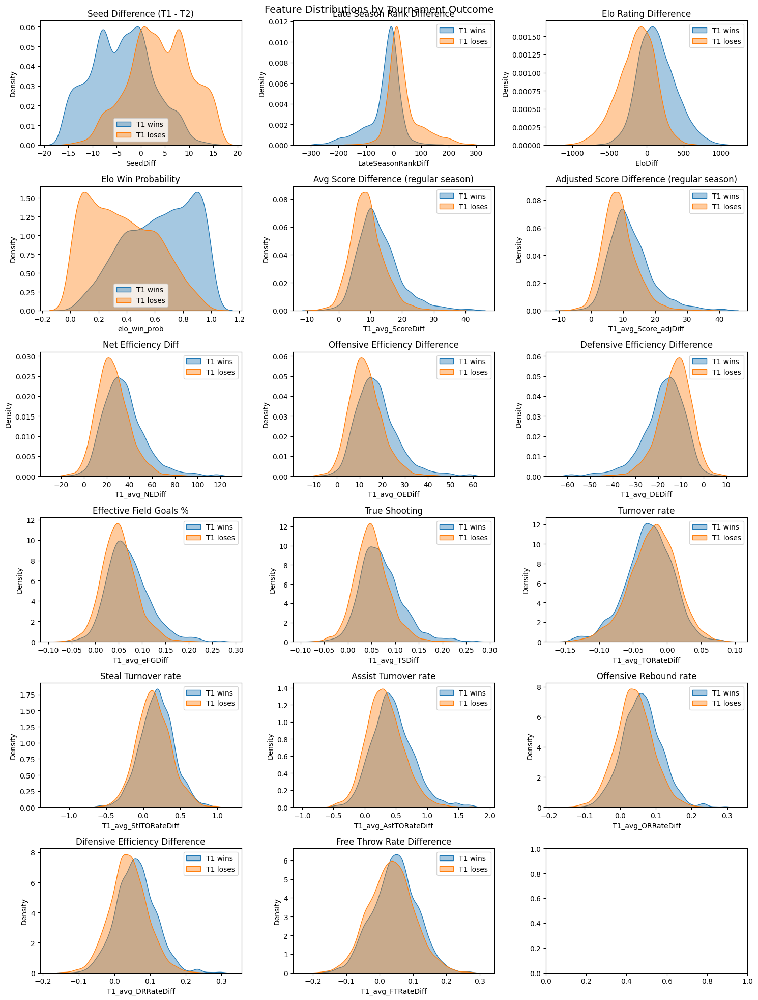

In [54]:
# Distribution of key engineered features, split by tournament outcome
features_to_plot = {
    'SeedDiff':          'Seed Difference (T1 - T2)',
    'LateSeasonRankDiff':'Late Season Rank Difference',
    'EloDiff':           'Elo Rating Difference',
    'elo_win_prob':      'Elo Win Probability',
    'T1_avg_ScoreDiff':  'Avg Score Difference (regular season)',
    'T1_avg_Score_adjDiff':  'Adjusted Score Difference (regular season)',
    'T1_avg_NEDiff':     'Net Efficiency Diff',
    'T1_avg_OEDiff':     'Offensive Efficiency Difference',
    'T1_avg_DEDiff':     'Defensive Efficiency Difference',
    'T1_avg_eFGDiff':    'Effective Field Goals %',
    'T1_avg_TSDiff':     'True Shooting',
    'T1_avg_TORateDiff': 'Turnover rate',
    'T1_avg_StlTORateDiff':      'Steal Turnover rate',
    'T1_avg_AstTORateDiff': 'Assist Turnover rate',
    'T1_avg_ORRateDiff':     'Offensive Rebound rate',
    'T1_avg_DRRateDiff':     'Difensive Efficiency Difference',
    'T1_avg_FTRateDiff':     'Free Throw Rate Difference',
}

wins   = tourney_results_with_features[tourney_results_with_features['Outcome'] == "win"]
losses = tourney_results_with_features[tourney_results_with_features['Outcome'] == "lose"]

fig, axes = plt.subplots(6, 3, figsize=(15, 20))
for ax, (col, title) in zip(axes.flat, features_to_plot.items()):
    seaborn.kdeplot(wins[col].dropna(),   label='T1 wins',  ax=ax, fill=True, alpha=0.4)
    seaborn.kdeplot(losses[col].dropna(), label='T1 loses', ax=ax, fill=True, alpha=0.4)
    ax.set_title(title)
    ax.legend()
plt.suptitle('Feature Distributions by Tournament Outcome', fontsize=14)
plt.tight_layout()
plt.show()

In [55]:
# ── Team stats lookup (built once, used by all dashboard panels) ────────────
import os

_STAT_COLS = [
    'T1_avg_Score', 'T1_avg_NE', 'T1_avg_OE', 'T1_avg_DE',
    'T1_avg_eFG', 'T1_avg_TORate', 'T1_avg_ORRate', 'T1_avg_FTRate',
    'T1_avg_ScoreDiff', 'T1LateSeasonRank', 'T1Seed', 'T1_Elo',
]
_available_stat_cols = [c for c in _STAT_COLS if c in tourney_results_with_features.columns]

team_stats_df = (
    tourney_results_with_features[['Season','T1TeamID','Category'] + _available_stat_cols]
    .drop_duplicates(subset=['Season','T1TeamID'])
    .copy()
)

# ELO history: pre-game ELO per team per game day
elo_hist = (
    regular_results_per_game_stats_with_elo[['Season','DayNum','T1TeamID','T1_Elo_Before']]
    .copy()
    .rename(columns={'T1TeamID':'TeamID','T1_Elo_Before':'Elo'})
)

# Team name lookup — tries MTeams.csv / WTeams.csv, falls back to numeric ID
_id2name = {}
for fname in ['MTeams.csv','WTeams.csv']:
    _path = os.path.join(data_dir, fname)
    if os.path.exists(_path):
        _t = pd.read_csv(_path)
        _id2name.update(dict(zip(_t['TeamID'], _t['TeamName'])))

def _get_name(tid):
    return _id2name.get(int(tid), f'Team {int(tid)}')

print(f'team_stats_df: {len(team_stats_df)} rows | '
      f'{team_stats_df["Season"].nunique()} seasons | '
      f'{team_stats_df["T1TeamID"].nunique()} unique teams')
print(f'Name lookup: {len(_id2name)} teams found ({"MTeams.csv / WTeams.csv" if _id2name else "not found — using numeric IDs"})')


team_stats_df: 2447 rows | 22 seasons | 508 unique teams
Name lookup: 760 teams found (MTeams.csv / WTeams.csv)


In [56]:
# ═══════════════════════════════════════════════════════════════════════════
# HOOK 1 — TEAM EXPLORER
# Inserted after feature-distribution plots, before modelling section.
# Requires: team_stats_df, elo_hist, _get_name  (built in setup cell above)
# ═══════════════════════════════════════════════════════════════════════════

out_explorer = Output()

_seasons_ex = sorted(team_stats_df['Season'].unique(), reverse=True)
_dd_season_ex = widgets.Dropdown(
    options=_seasons_ex, value=_seasons_ex[0],
    description='Season:', style={'description_width':'70px'},
    layout=Layout(width='160px')
)
_dd_team_ex = widgets.Dropdown(
    options=[], description='Team:',
    style={'description_width':'60px'}, layout=Layout(width='260px')
)

def _update_teams_ex(change=None):
    s = _dd_season_ex.value
    ids = sorted(team_stats_df[team_stats_df['Season']==s]['T1TeamID'].unique())
    _dd_team_ex.options = [(_get_name(t), t) for t in ids]

def _plot_team(change=None):
    s = _dd_season_ex.value
    tid = _dd_team_ex.value
    if tid is None:
        return
    row = team_stats_df[(team_stats_df['Season']==s) & (team_stats_df['T1TeamID']==tid)]
    if row.empty:
        return
    row = row.iloc[0]

    # --- radar: normalise each stat to [0,1] percentile within that season ---
    _radar_map = [
        ('eFG%',          'T1_avg_eFG',    False),
        ('Net Eff.',      'T1_avg_NE',     False),
        ('Off. Eff.',     'T1_avg_OE',     False),
        ('Def. Eff.',     'T1_avg_DE',     True),   # lower is better
        ('TO Rate',       'T1_avg_TORate', True),   # lower is better
        ('OR Rate',       'T1_avg_ORRate', False),
        ('FT Rate',       'T1_avg_FTRate', False),
    ]
    season_slice = team_stats_df[team_stats_df['Season']==s]
    radar_labels, radar_vals = [], []
    for label, col, invert in _radar_map:
        if col not in season_slice.columns:
            continue
        lo = season_slice[col].quantile(0.05)
        hi = season_slice[col].quantile(0.95)
        v = float((row[col] - lo) / (hi - lo + 1e-9))
        v = max(0.0, min(1.0, v))
        radar_labels.append(label)
        radar_vals.append(1 - v if invert else v)

    # --- ELO history for this team this season ---
    eh = elo_hist[(elo_hist['Season']==s) & (elo_hist['TeamID']==tid)].sort_values('DayNum')

    fig = make_subplots(
        rows=1, cols=2,
        specs=[[{'type':'polar'}, {'type':'xy'}]],
        subplot_titles=['Season stats (percentile rank)', 'ELO rating across season'],
    )

    if radar_vals:
        rl_closed = radar_labels + [radar_labels[0]]
        rv_closed = radar_vals   + [radar_vals[0]]
        fig.add_trace(go.Scatterpolar(
            r=rv_closed, theta=rl_closed, fill='toself',
            line_color='#534AB7', fillcolor='rgba(83,74,183,0.22)', name='Stats',
        ), row=1, col=1)

    if not eh.empty:
        fig.add_trace(go.Scatter(
            x=eh['DayNum'], y=eh['Elo'], mode='lines+markers',
            line=dict(color='#1D9E75', width=2), marker=dict(size=3), name='ELO',
        ), row=1, col=2)
        fig.add_hline(y=1500, line_dash='dash', line_color='#aaa',
                      annotation_text='baseline', row=1, col=2)

    seed_str  = f' | Seed {int(row["T1Seed"])}' if 'T1Seed' in row.index else ''
    rank_str  = f' | Rank {row["T1LateSeasonRank"]:.0f}' if 'T1LateSeasonRank' in row.index else ''
    elo_str   = f' | ELO {row["T1_Elo"]:.0f}' if 'T1_Elo' in row.index else ''
    score_str = f' | Avg score {row["T1_avg_Score"]:.1f}' if 'T1_avg_Score' in row.index else ''

    fig.update_layout(
        title=f'<b>{_get_name(tid)}</b>  ({s}){seed_str}{rank_str}{elo_str}{score_str}',
        height=420, margin=dict(t=70, b=20, l=20, r=20),
        polar=dict(radialaxis=dict(visible=True, range=[0,1], tickfont_size=9)),
        showlegend=False,
    )

    with out_explorer:
        clear_output(wait=True)
        fig.show()

_dd_season_ex.observe(lambda c: (_update_teams_ex(c), _plot_team(c)), names='value')
_dd_team_ex.observe(_plot_team, names='value')
_update_teams_ex()

display(VBox([
    HTML('<h3 style="margin:0 0 10px">Team Explorer</h3>'),
    HBox([_dd_season_ex, _dd_team_ex]),
    out_explorer,
]))
_plot_team()


PlotlyKeyError: Invalid property specified for object of type plotly.graph_objs.Scatterpolar: 'xaxis'

Did you mean "ids"?

    Valid properties:
        cliponaxis
            Determines whether or not markers and text nodes are
            clipped about the subplot axes. To show markers and
            text nodes above axis lines and tick labels, make sure
            to set `xaxis.layer` and `yaxis.layer` to *below
            traces*.
        connectgaps
            Determines whether or not gaps (i.e. {nan} or missing
            values) in the provided data arrays are connected.
        customdata
            Assigns extra data each datum. This may be useful when
            listening to hover, click and selection events. Note
            that, "scatter" traces also appends customdata items in
            the markers DOM elements
        customdatasrc
            Sets the source reference on Chart Studio Cloud for
            `customdata`.
        dr
            Sets the r coordinate step.
        dtheta
            Sets the theta coordinate step. By default, the
            `dtheta` step equals the subplot's period divided by
            the length of the `r` coordinates.
        fill
            Sets the area to fill with a solid color. Use with
            `fillcolor` if not "none". scatterpolar has a subset of
            the options available to scatter. "toself" connects the
            endpoints of the trace (or each segment of the trace if
            it has gaps) into a closed shape. "tonext" fills the
            space between two traces if one completely encloses the
            other (eg consecutive contour lines), and behaves like
            "toself" if there is no trace before it. "tonext"
            should not be used if one trace does not enclose the
            other.
        fillcolor
            Sets the fill color. Defaults to a half-transparent
            variant of the line color, marker color, or marker line
            color, whichever is available.
        hoverinfo
            Determines which trace information appear on hover. If
            `none` or `skip` are set, no information is displayed
            upon hovering. But, if `none` is set, click and hover
            events are still fired.
        hoverinfosrc
            Sets the source reference on Chart Studio Cloud for
            `hoverinfo`.
        hoverlabel
            :class:`plotly.graph_objects.scatterpolar.Hoverlabel`
            instance or dict with compatible properties
        hoveron
            Do the hover effects highlight individual points
            (markers or line points) or do they highlight filled
            regions? If the fill is "toself" or "tonext" and there
            are no markers or text, then the default is "fills",
            otherwise it is "points".
        hovertemplate
            Template string used for rendering the information that
            appear on hover box. Note that this will override
            `hoverinfo`. Variables are inserted using %{variable},
            for example "y: %{y}" as well as %{xother}, {%_xother},
            {%_xother_}, {%xother_}. When showing info for several
            points, "xother" will be added to those with different
            x positions from the first point. An underscore before
            or after "(x|y)other" will add a space on that side,
            only when this field is shown. Numbers are formatted
            using d3-format's syntax %{variable:d3-format}, for
            example "Price: %{y:$.2f}".
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format
            for details on the formatting syntax. Dates are
            formatted using d3-time-format's syntax
            %{variable|d3-time-format}, for example "Day:
            %{2019-01-01|%A}". https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format for details on the
            date formatting syntax. Variables that can't be found
            will be replaced with the specifier. For example, a
            template of "data: %{x}, %{y}" will result in a value
            of "data: 1, %{y}" if x is 1 and y is missing.
            Variables with an undefined value will be replaced with
            the fallback value. The variables available in
            `hovertemplate` are the ones emitted as event data
            described at this link
            https://plotly.com/javascript/plotlyjs-events/#event-
            data. Additionally, all attributes that can be
            specified per-point (the ones that are `arrayOk: true`)
            are available.  Anything contained in tag `<extra>` is
            displayed in the secondary box, for example
            `<extra>%{fullData.name}</extra>`. To hide the
            secondary box completely, use an empty tag
            `<extra></extra>`.
        hovertemplatefallback
            Fallback string that's displayed when a variable
            referenced in a template is missing. If the boolean
            value 'false' is passed in, the specifier with the
            missing variable will be displayed.
        hovertemplatesrc
            Sets the source reference on Chart Studio Cloud for
            `hovertemplate`.
        hovertext
            Sets hover text elements associated with each (x,y)
            pair. If a single string, the same string appears over
            all the data points. If an array of string, the items
            are mapped in order to the this trace's (x,y)
            coordinates. To be seen, trace `hoverinfo` must contain
            a "text" flag.
        hovertextsrc
            Sets the source reference on Chart Studio Cloud for
            `hovertext`.
        ids
            Assigns id labels to each datum. These ids for object
            constancy of data points during animation. Should be an
            array of strings, not numbers or any other type.
        idssrc
            Sets the source reference on Chart Studio Cloud for
            `ids`.
        legend
            Sets the reference to a legend to show this trace in.
            References to these legends are "legend", "legend2",
            "legend3", etc. Settings for these legends are set in
            the layout, under `layout.legend`, `layout.legend2`,
            etc.
        legendgroup
            Sets the legend group for this trace. Traces and shapes
            part of the same legend group hide/show at the same
            time when toggling legend items.
        legendgrouptitle
            :class:`plotly.graph_objects.scatterpolar.Legendgroupti
            tle` instance or dict with compatible properties
        legendrank
            Sets the legend rank for this trace. Items and groups
            with smaller ranks are presented on top/left side while
            with "reversed" `legend.traceorder` they are on
            bottom/right side. The default legendrank is 1000, so
            that you can use ranks less than 1000 to place certain
            items before all unranked items, and ranks greater than
            1000 to go after all unranked items. When having
            unranked or equal rank items shapes would be displayed
            after traces i.e. according to their order in data and
            layout.
        legendwidth
            Sets the width (in px or fraction) of the legend for
            this trace.
        line
            :class:`plotly.graph_objects.scatterpolar.Line`
            instance or dict with compatible properties
        marker
            :class:`plotly.graph_objects.scatterpolar.Marker`
            instance or dict with compatible properties
        meta
            Assigns extra meta information associated with this
            trace that can be used in various text attributes.
            Attributes such as trace `name`, graph, axis and
            colorbar `title.text`, annotation `text`
            `rangeselector`, `updatemenues` and `sliders` `label`
            text all support `meta`. To access the trace `meta`
            values in an attribute in the same trace, simply use
            `%{meta[i]}` where `i` is the index or key of the
            `meta` item in question. To access trace `meta` in
            layout attributes, use `%{data[n[.meta[i]}` where `i`
            is the index or key of the `meta` and `n` is the trace
            index.
        metasrc
            Sets the source reference on Chart Studio Cloud for
            `meta`.
        mode
            Determines the drawing mode for this scatter trace. If
            the provided `mode` includes "text" then the `text`
            elements appear at the coordinates. Otherwise, the
            `text` elements appear on hover. If there are less than
            20 points and the trace is not stacked then the default
            is "lines+markers". Otherwise, "lines".
        name
            Sets the trace name. The trace name appears as the
            legend item and on hover.
        opacity
            Sets the opacity of the trace.
        r
            Sets the radial coordinates
        r0
            Alternate to `r`. Builds a linear space of r
            coordinates. Use with `dr` where `r0` is the starting
            coordinate and `dr` the step.
        rsrc
            Sets the source reference on Chart Studio Cloud for
            `r`.
        selected
            :class:`plotly.graph_objects.scatterpolar.Selected`
            instance or dict with compatible properties
        selectedpoints
            Array containing integer indices of selected points.
            Has an effect only for traces that support selections.
            Note that an empty array means an empty selection where
            the `unselected` are turned on for all points, whereas,
            any other non-array values means no selection all where
            the `selected` and `unselected` styles have no effect.
        showlegend
            Determines whether or not an item corresponding to this
            trace is shown in the legend.
        stream
            :class:`plotly.graph_objects.scatterpolar.Stream`
            instance or dict with compatible properties
        subplot
            Sets a reference between this trace's data coordinates
            and a polar subplot. If "polar" (the default value),
            the data refer to `layout.polar`. If "polar2", the data
            refer to `layout.polar2`, and so on.
        text
            Sets text elements associated with each (x,y) pair. If
            a single string, the same string appears over all the
            data points. If an array of string, the items are
            mapped in order to the this trace's (x,y) coordinates.
            If trace `hoverinfo` contains a "text" flag and
            "hovertext" is not set, these elements will be seen in
            the hover labels.
        textfont
            Sets the text font.
        textposition
            Sets the positions of the `text` elements with respects
            to the (x,y) coordinates.
        textpositionsrc
            Sets the source reference on Chart Studio Cloud for
            `textposition`.
        textsrc
            Sets the source reference on Chart Studio Cloud for
            `text`.
        texttemplate
            Template string used for rendering the information text
            that appears on points. Note that this will override
            `textinfo`. Variables are inserted using %{variable},
            for example "y: %{y}". Numbers are formatted using
            d3-format's syntax %{variable:d3-format}, for example
            "Price: %{y:$.2f}".
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format
            for details on the formatting syntax. Dates are
            formatted using d3-time-format's syntax
            %{variable|d3-time-format}, for example "Day:
            %{2019-01-01|%A}". https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format for details on the
            date formatting syntax. Variables that can't be found
            will be replaced with the specifier. For example, a
            template of "data: %{x}, %{y}" will result in a value
            of "data: 1, %{y}" if x is 1 and y is missing.
            Variables with an undefined value will be replaced with
            the fallback value. All attributes that can be
            specified per-point (the ones that are `arrayOk: true`)
            are available. Finally, the template string has access
            to variables `r`, `theta` and `text`.
        texttemplatefallback
            Fallback string that's displayed when a variable
            referenced in a template is missing. If the boolean
            value 'false' is passed in, the specifier with the
            missing variable will be displayed.
        texttemplatesrc
            Sets the source reference on Chart Studio Cloud for
            `texttemplate`.
        theta
            Sets the angular coordinates
        theta0
            Alternate to `theta`. Builds a linear space of theta
            coordinates. Use with `dtheta` where `theta0` is the
            starting coordinate and `dtheta` the step.
        thetasrc
            Sets the source reference on Chart Studio Cloud for
            `theta`.
        thetaunit
            Sets the unit of input "theta" values. Has an effect
            only when on "linear" angular axes.
        uid
            Assign an id to this trace, Use this to provide object
            constancy between traces during animations and
            transitions.
        uirevision
            Controls persistence of some user-driven changes to the
            trace: `constraintrange` in `parcoords` traces, as well
            as some `editable: true` modifications such as `name`
            and `colorbar.title`. Defaults to `layout.uirevision`.
            Note that other user-driven trace attribute changes are
            controlled by `layout` attributes: `trace.visible` is
            controlled by `layout.legend.uirevision`,
            `selectedpoints` is controlled by
            `layout.selectionrevision`, and `colorbar.(x|y)`
            (accessible with `config: {editable: true}`) is
            controlled by `layout.editrevision`. Trace changes are
            tracked by `uid`, which only falls back on trace index
            if no `uid` is provided. So if your app can add/remove
            traces before the end of the `data` array, such that
            the same trace has a different index, you can still
            preserve user-driven changes if you give each trace a
            `uid` that stays with it as it moves.
        unselected
            :class:`plotly.graph_objects.scatterpolar.Unselected`
            instance or dict with compatible properties
        visible
            Determines whether or not this trace is visible. If
            "legendonly", the trace is not drawn, but can appear as
            a legend item (provided that the legend itself is
            visible).
        
Did you mean "ids"?


PlotlyKeyError: Invalid property specified for object of type plotly.graph_objs.Scatterpolar: 'xaxis'

Did you mean "ids"?

    Valid properties:
        cliponaxis
            Determines whether or not markers and text nodes are
            clipped about the subplot axes. To show markers and
            text nodes above axis lines and tick labels, make sure
            to set `xaxis.layer` and `yaxis.layer` to *below
            traces*.
        connectgaps
            Determines whether or not gaps (i.e. {nan} or missing
            values) in the provided data arrays are connected.
        customdata
            Assigns extra data each datum. This may be useful when
            listening to hover, click and selection events. Note
            that, "scatter" traces also appends customdata items in
            the markers DOM elements
        customdatasrc
            Sets the source reference on Chart Studio Cloud for
            `customdata`.
        dr
            Sets the r coordinate step.
        dtheta
            Sets the theta coordinate step. By default, the
            `dtheta` step equals the subplot's period divided by
            the length of the `r` coordinates.
        fill
            Sets the area to fill with a solid color. Use with
            `fillcolor` if not "none". scatterpolar has a subset of
            the options available to scatter. "toself" connects the
            endpoints of the trace (or each segment of the trace if
            it has gaps) into a closed shape. "tonext" fills the
            space between two traces if one completely encloses the
            other (eg consecutive contour lines), and behaves like
            "toself" if there is no trace before it. "tonext"
            should not be used if one trace does not enclose the
            other.
        fillcolor
            Sets the fill color. Defaults to a half-transparent
            variant of the line color, marker color, or marker line
            color, whichever is available.
        hoverinfo
            Determines which trace information appear on hover. If
            `none` or `skip` are set, no information is displayed
            upon hovering. But, if `none` is set, click and hover
            events are still fired.
        hoverinfosrc
            Sets the source reference on Chart Studio Cloud for
            `hoverinfo`.
        hoverlabel
            :class:`plotly.graph_objects.scatterpolar.Hoverlabel`
            instance or dict with compatible properties
        hoveron
            Do the hover effects highlight individual points
            (markers or line points) or do they highlight filled
            regions? If the fill is "toself" or "tonext" and there
            are no markers or text, then the default is "fills",
            otherwise it is "points".
        hovertemplate
            Template string used for rendering the information that
            appear on hover box. Note that this will override
            `hoverinfo`. Variables are inserted using %{variable},
            for example "y: %{y}" as well as %{xother}, {%_xother},
            {%_xother_}, {%xother_}. When showing info for several
            points, "xother" will be added to those with different
            x positions from the first point. An underscore before
            or after "(x|y)other" will add a space on that side,
            only when this field is shown. Numbers are formatted
            using d3-format's syntax %{variable:d3-format}, for
            example "Price: %{y:$.2f}".
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format
            for details on the formatting syntax. Dates are
            formatted using d3-time-format's syntax
            %{variable|d3-time-format}, for example "Day:
            %{2019-01-01|%A}". https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format for details on the
            date formatting syntax. Variables that can't be found
            will be replaced with the specifier. For example, a
            template of "data: %{x}, %{y}" will result in a value
            of "data: 1, %{y}" if x is 1 and y is missing.
            Variables with an undefined value will be replaced with
            the fallback value. The variables available in
            `hovertemplate` are the ones emitted as event data
            described at this link
            https://plotly.com/javascript/plotlyjs-events/#event-
            data. Additionally, all attributes that can be
            specified per-point (the ones that are `arrayOk: true`)
            are available.  Anything contained in tag `<extra>` is
            displayed in the secondary box, for example
            `<extra>%{fullData.name}</extra>`. To hide the
            secondary box completely, use an empty tag
            `<extra></extra>`.
        hovertemplatefallback
            Fallback string that's displayed when a variable
            referenced in a template is missing. If the boolean
            value 'false' is passed in, the specifier with the
            missing variable will be displayed.
        hovertemplatesrc
            Sets the source reference on Chart Studio Cloud for
            `hovertemplate`.
        hovertext
            Sets hover text elements associated with each (x,y)
            pair. If a single string, the same string appears over
            all the data points. If an array of string, the items
            are mapped in order to the this trace's (x,y)
            coordinates. To be seen, trace `hoverinfo` must contain
            a "text" flag.
        hovertextsrc
            Sets the source reference on Chart Studio Cloud for
            `hovertext`.
        ids
            Assigns id labels to each datum. These ids for object
            constancy of data points during animation. Should be an
            array of strings, not numbers or any other type.
        idssrc
            Sets the source reference on Chart Studio Cloud for
            `ids`.
        legend
            Sets the reference to a legend to show this trace in.
            References to these legends are "legend", "legend2",
            "legend3", etc. Settings for these legends are set in
            the layout, under `layout.legend`, `layout.legend2`,
            etc.
        legendgroup
            Sets the legend group for this trace. Traces and shapes
            part of the same legend group hide/show at the same
            time when toggling legend items.
        legendgrouptitle
            :class:`plotly.graph_objects.scatterpolar.Legendgroupti
            tle` instance or dict with compatible properties
        legendrank
            Sets the legend rank for this trace. Items and groups
            with smaller ranks are presented on top/left side while
            with "reversed" `legend.traceorder` they are on
            bottom/right side. The default legendrank is 1000, so
            that you can use ranks less than 1000 to place certain
            items before all unranked items, and ranks greater than
            1000 to go after all unranked items. When having
            unranked or equal rank items shapes would be displayed
            after traces i.e. according to their order in data and
            layout.
        legendwidth
            Sets the width (in px or fraction) of the legend for
            this trace.
        line
            :class:`plotly.graph_objects.scatterpolar.Line`
            instance or dict with compatible properties
        marker
            :class:`plotly.graph_objects.scatterpolar.Marker`
            instance or dict with compatible properties
        meta
            Assigns extra meta information associated with this
            trace that can be used in various text attributes.
            Attributes such as trace `name`, graph, axis and
            colorbar `title.text`, annotation `text`
            `rangeselector`, `updatemenues` and `sliders` `label`
            text all support `meta`. To access the trace `meta`
            values in an attribute in the same trace, simply use
            `%{meta[i]}` where `i` is the index or key of the
            `meta` item in question. To access trace `meta` in
            layout attributes, use `%{data[n[.meta[i]}` where `i`
            is the index or key of the `meta` and `n` is the trace
            index.
        metasrc
            Sets the source reference on Chart Studio Cloud for
            `meta`.
        mode
            Determines the drawing mode for this scatter trace. If
            the provided `mode` includes "text" then the `text`
            elements appear at the coordinates. Otherwise, the
            `text` elements appear on hover. If there are less than
            20 points and the trace is not stacked then the default
            is "lines+markers". Otherwise, "lines".
        name
            Sets the trace name. The trace name appears as the
            legend item and on hover.
        opacity
            Sets the opacity of the trace.
        r
            Sets the radial coordinates
        r0
            Alternate to `r`. Builds a linear space of r
            coordinates. Use with `dr` where `r0` is the starting
            coordinate and `dr` the step.
        rsrc
            Sets the source reference on Chart Studio Cloud for
            `r`.
        selected
            :class:`plotly.graph_objects.scatterpolar.Selected`
            instance or dict with compatible properties
        selectedpoints
            Array containing integer indices of selected points.
            Has an effect only for traces that support selections.
            Note that an empty array means an empty selection where
            the `unselected` are turned on for all points, whereas,
            any other non-array values means no selection all where
            the `selected` and `unselected` styles have no effect.
        showlegend
            Determines whether or not an item corresponding to this
            trace is shown in the legend.
        stream
            :class:`plotly.graph_objects.scatterpolar.Stream`
            instance or dict with compatible properties
        subplot
            Sets a reference between this trace's data coordinates
            and a polar subplot. If "polar" (the default value),
            the data refer to `layout.polar`. If "polar2", the data
            refer to `layout.polar2`, and so on.
        text
            Sets text elements associated with each (x,y) pair. If
            a single string, the same string appears over all the
            data points. If an array of string, the items are
            mapped in order to the this trace's (x,y) coordinates.
            If trace `hoverinfo` contains a "text" flag and
            "hovertext" is not set, these elements will be seen in
            the hover labels.
        textfont
            Sets the text font.
        textposition
            Sets the positions of the `text` elements with respects
            to the (x,y) coordinates.
        textpositionsrc
            Sets the source reference on Chart Studio Cloud for
            `textposition`.
        textsrc
            Sets the source reference on Chart Studio Cloud for
            `text`.
        texttemplate
            Template string used for rendering the information text
            that appears on points. Note that this will override
            `textinfo`. Variables are inserted using %{variable},
            for example "y: %{y}". Numbers are formatted using
            d3-format's syntax %{variable:d3-format}, for example
            "Price: %{y:$.2f}".
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format
            for details on the formatting syntax. Dates are
            formatted using d3-time-format's syntax
            %{variable|d3-time-format}, for example "Day:
            %{2019-01-01|%A}". https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format for details on the
            date formatting syntax. Variables that can't be found
            will be replaced with the specifier. For example, a
            template of "data: %{x}, %{y}" will result in a value
            of "data: 1, %{y}" if x is 1 and y is missing.
            Variables with an undefined value will be replaced with
            the fallback value. All attributes that can be
            specified per-point (the ones that are `arrayOk: true`)
            are available. Finally, the template string has access
            to variables `r`, `theta` and `text`.
        texttemplatefallback
            Fallback string that's displayed when a variable
            referenced in a template is missing. If the boolean
            value 'false' is passed in, the specifier with the
            missing variable will be displayed.
        texttemplatesrc
            Sets the source reference on Chart Studio Cloud for
            `texttemplate`.
        theta
            Sets the angular coordinates
        theta0
            Alternate to `theta`. Builds a linear space of theta
            coordinates. Use with `dtheta` where `theta0` is the
            starting coordinate and `dtheta` the step.
        thetasrc
            Sets the source reference on Chart Studio Cloud for
            `theta`.
        thetaunit
            Sets the unit of input "theta" values. Has an effect
            only when on "linear" angular axes.
        uid
            Assign an id to this trace, Use this to provide object
            constancy between traces during animations and
            transitions.
        uirevision
            Controls persistence of some user-driven changes to the
            trace: `constraintrange` in `parcoords` traces, as well
            as some `editable: true` modifications such as `name`
            and `colorbar.title`. Defaults to `layout.uirevision`.
            Note that other user-driven trace attribute changes are
            controlled by `layout` attributes: `trace.visible` is
            controlled by `layout.legend.uirevision`,
            `selectedpoints` is controlled by
            `layout.selectionrevision`, and `colorbar.(x|y)`
            (accessible with `config: {editable: true}`) is
            controlled by `layout.editrevision`. Trace changes are
            tracked by `uid`, which only falls back on trace index
            if no `uid` is provided. So if your app can add/remove
            traces before the end of the `data` array, such that
            the same trace has a different index, you can still
            preserve user-driven changes if you give each trace a
            `uid` that stays with it as it moves.
        unselected
            :class:`plotly.graph_objects.scatterpolar.Unselected`
            instance or dict with compatible properties
        visible
            Determines whether or not this trace is visible. If
            "legendonly", the trace is not drawn, but can appear as
            a legend item (provided that the legend itself is
            visible).
        
Did you mean "ids"?


PlotlyKeyError: Invalid property specified for object of type plotly.graph_objs.Scatterpolar: 'xaxis'

Did you mean "ids"?

    Valid properties:
        cliponaxis
            Determines whether or not markers and text nodes are
            clipped about the subplot axes. To show markers and
            text nodes above axis lines and tick labels, make sure
            to set `xaxis.layer` and `yaxis.layer` to *below
            traces*.
        connectgaps
            Determines whether or not gaps (i.e. {nan} or missing
            values) in the provided data arrays are connected.
        customdata
            Assigns extra data each datum. This may be useful when
            listening to hover, click and selection events. Note
            that, "scatter" traces also appends customdata items in
            the markers DOM elements
        customdatasrc
            Sets the source reference on Chart Studio Cloud for
            `customdata`.
        dr
            Sets the r coordinate step.
        dtheta
            Sets the theta coordinate step. By default, the
            `dtheta` step equals the subplot's period divided by
            the length of the `r` coordinates.
        fill
            Sets the area to fill with a solid color. Use with
            `fillcolor` if not "none". scatterpolar has a subset of
            the options available to scatter. "toself" connects the
            endpoints of the trace (or each segment of the trace if
            it has gaps) into a closed shape. "tonext" fills the
            space between two traces if one completely encloses the
            other (eg consecutive contour lines), and behaves like
            "toself" if there is no trace before it. "tonext"
            should not be used if one trace does not enclose the
            other.
        fillcolor
            Sets the fill color. Defaults to a half-transparent
            variant of the line color, marker color, or marker line
            color, whichever is available.
        hoverinfo
            Determines which trace information appear on hover. If
            `none` or `skip` are set, no information is displayed
            upon hovering. But, if `none` is set, click and hover
            events are still fired.
        hoverinfosrc
            Sets the source reference on Chart Studio Cloud for
            `hoverinfo`.
        hoverlabel
            :class:`plotly.graph_objects.scatterpolar.Hoverlabel`
            instance or dict with compatible properties
        hoveron
            Do the hover effects highlight individual points
            (markers or line points) or do they highlight filled
            regions? If the fill is "toself" or "tonext" and there
            are no markers or text, then the default is "fills",
            otherwise it is "points".
        hovertemplate
            Template string used for rendering the information that
            appear on hover box. Note that this will override
            `hoverinfo`. Variables are inserted using %{variable},
            for example "y: %{y}" as well as %{xother}, {%_xother},
            {%_xother_}, {%xother_}. When showing info for several
            points, "xother" will be added to those with different
            x positions from the first point. An underscore before
            or after "(x|y)other" will add a space on that side,
            only when this field is shown. Numbers are formatted
            using d3-format's syntax %{variable:d3-format}, for
            example "Price: %{y:$.2f}".
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format
            for details on the formatting syntax. Dates are
            formatted using d3-time-format's syntax
            %{variable|d3-time-format}, for example "Day:
            %{2019-01-01|%A}". https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format for details on the
            date formatting syntax. Variables that can't be found
            will be replaced with the specifier. For example, a
            template of "data: %{x}, %{y}" will result in a value
            of "data: 1, %{y}" if x is 1 and y is missing.
            Variables with an undefined value will be replaced with
            the fallback value. The variables available in
            `hovertemplate` are the ones emitted as event data
            described at this link
            https://plotly.com/javascript/plotlyjs-events/#event-
            data. Additionally, all attributes that can be
            specified per-point (the ones that are `arrayOk: true`)
            are available.  Anything contained in tag `<extra>` is
            displayed in the secondary box, for example
            `<extra>%{fullData.name}</extra>`. To hide the
            secondary box completely, use an empty tag
            `<extra></extra>`.
        hovertemplatefallback
            Fallback string that's displayed when a variable
            referenced in a template is missing. If the boolean
            value 'false' is passed in, the specifier with the
            missing variable will be displayed.
        hovertemplatesrc
            Sets the source reference on Chart Studio Cloud for
            `hovertemplate`.
        hovertext
            Sets hover text elements associated with each (x,y)
            pair. If a single string, the same string appears over
            all the data points. If an array of string, the items
            are mapped in order to the this trace's (x,y)
            coordinates. To be seen, trace `hoverinfo` must contain
            a "text" flag.
        hovertextsrc
            Sets the source reference on Chart Studio Cloud for
            `hovertext`.
        ids
            Assigns id labels to each datum. These ids for object
            constancy of data points during animation. Should be an
            array of strings, not numbers or any other type.
        idssrc
            Sets the source reference on Chart Studio Cloud for
            `ids`.
        legend
            Sets the reference to a legend to show this trace in.
            References to these legends are "legend", "legend2",
            "legend3", etc. Settings for these legends are set in
            the layout, under `layout.legend`, `layout.legend2`,
            etc.
        legendgroup
            Sets the legend group for this trace. Traces and shapes
            part of the same legend group hide/show at the same
            time when toggling legend items.
        legendgrouptitle
            :class:`plotly.graph_objects.scatterpolar.Legendgroupti
            tle` instance or dict with compatible properties
        legendrank
            Sets the legend rank for this trace. Items and groups
            with smaller ranks are presented on top/left side while
            with "reversed" `legend.traceorder` they are on
            bottom/right side. The default legendrank is 1000, so
            that you can use ranks less than 1000 to place certain
            items before all unranked items, and ranks greater than
            1000 to go after all unranked items. When having
            unranked or equal rank items shapes would be displayed
            after traces i.e. according to their order in data and
            layout.
        legendwidth
            Sets the width (in px or fraction) of the legend for
            this trace.
        line
            :class:`plotly.graph_objects.scatterpolar.Line`
            instance or dict with compatible properties
        marker
            :class:`plotly.graph_objects.scatterpolar.Marker`
            instance or dict with compatible properties
        meta
            Assigns extra meta information associated with this
            trace that can be used in various text attributes.
            Attributes such as trace `name`, graph, axis and
            colorbar `title.text`, annotation `text`
            `rangeselector`, `updatemenues` and `sliders` `label`
            text all support `meta`. To access the trace `meta`
            values in an attribute in the same trace, simply use
            `%{meta[i]}` where `i` is the index or key of the
            `meta` item in question. To access trace `meta` in
            layout attributes, use `%{data[n[.meta[i]}` where `i`
            is the index or key of the `meta` and `n` is the trace
            index.
        metasrc
            Sets the source reference on Chart Studio Cloud for
            `meta`.
        mode
            Determines the drawing mode for this scatter trace. If
            the provided `mode` includes "text" then the `text`
            elements appear at the coordinates. Otherwise, the
            `text` elements appear on hover. If there are less than
            20 points and the trace is not stacked then the default
            is "lines+markers". Otherwise, "lines".
        name
            Sets the trace name. The trace name appears as the
            legend item and on hover.
        opacity
            Sets the opacity of the trace.
        r
            Sets the radial coordinates
        r0
            Alternate to `r`. Builds a linear space of r
            coordinates. Use with `dr` where `r0` is the starting
            coordinate and `dr` the step.
        rsrc
            Sets the source reference on Chart Studio Cloud for
            `r`.
        selected
            :class:`plotly.graph_objects.scatterpolar.Selected`
            instance or dict with compatible properties
        selectedpoints
            Array containing integer indices of selected points.
            Has an effect only for traces that support selections.
            Note that an empty array means an empty selection where
            the `unselected` are turned on for all points, whereas,
            any other non-array values means no selection all where
            the `selected` and `unselected` styles have no effect.
        showlegend
            Determines whether or not an item corresponding to this
            trace is shown in the legend.
        stream
            :class:`plotly.graph_objects.scatterpolar.Stream`
            instance or dict with compatible properties
        subplot
            Sets a reference between this trace's data coordinates
            and a polar subplot. If "polar" (the default value),
            the data refer to `layout.polar`. If "polar2", the data
            refer to `layout.polar2`, and so on.
        text
            Sets text elements associated with each (x,y) pair. If
            a single string, the same string appears over all the
            data points. If an array of string, the items are
            mapped in order to the this trace's (x,y) coordinates.
            If trace `hoverinfo` contains a "text" flag and
            "hovertext" is not set, these elements will be seen in
            the hover labels.
        textfont
            Sets the text font.
        textposition
            Sets the positions of the `text` elements with respects
            to the (x,y) coordinates.
        textpositionsrc
            Sets the source reference on Chart Studio Cloud for
            `textposition`.
        textsrc
            Sets the source reference on Chart Studio Cloud for
            `text`.
        texttemplate
            Template string used for rendering the information text
            that appears on points. Note that this will override
            `textinfo`. Variables are inserted using %{variable},
            for example "y: %{y}". Numbers are formatted using
            d3-format's syntax %{variable:d3-format}, for example
            "Price: %{y:$.2f}".
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format
            for details on the formatting syntax. Dates are
            formatted using d3-time-format's syntax
            %{variable|d3-time-format}, for example "Day:
            %{2019-01-01|%A}". https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format for details on the
            date formatting syntax. Variables that can't be found
            will be replaced with the specifier. For example, a
            template of "data: %{x}, %{y}" will result in a value
            of "data: 1, %{y}" if x is 1 and y is missing.
            Variables with an undefined value will be replaced with
            the fallback value. All attributes that can be
            specified per-point (the ones that are `arrayOk: true`)
            are available. Finally, the template string has access
            to variables `r`, `theta` and `text`.
        texttemplatefallback
            Fallback string that's displayed when a variable
            referenced in a template is missing. If the boolean
            value 'false' is passed in, the specifier with the
            missing variable will be displayed.
        texttemplatesrc
            Sets the source reference on Chart Studio Cloud for
            `texttemplate`.
        theta
            Sets the angular coordinates
        theta0
            Alternate to `theta`. Builds a linear space of theta
            coordinates. Use with `dtheta` where `theta0` is the
            starting coordinate and `dtheta` the step.
        thetasrc
            Sets the source reference on Chart Studio Cloud for
            `theta`.
        thetaunit
            Sets the unit of input "theta" values. Has an effect
            only when on "linear" angular axes.
        uid
            Assign an id to this trace, Use this to provide object
            constancy between traces during animations and
            transitions.
        uirevision
            Controls persistence of some user-driven changes to the
            trace: `constraintrange` in `parcoords` traces, as well
            as some `editable: true` modifications such as `name`
            and `colorbar.title`. Defaults to `layout.uirevision`.
            Note that other user-driven trace attribute changes are
            controlled by `layout` attributes: `trace.visible` is
            controlled by `layout.legend.uirevision`,
            `selectedpoints` is controlled by
            `layout.selectionrevision`, and `colorbar.(x|y)`
            (accessible with `config: {editable: true}`) is
            controlled by `layout.editrevision`. Trace changes are
            tracked by `uid`, which only falls back on trace index
            if no `uid` is provided. So if your app can add/remove
            traces before the end of the `data` array, such that
            the same trace has a different index, you can still
            preserve user-driven changes if you give each trace a
            `uid` that stays with it as it moves.
        unselected
            :class:`plotly.graph_objects.scatterpolar.Unselected`
            instance or dict with compatible properties
        visible
            Determines whether or not this trace is visible. If
            "legendonly", the trace is not drawn, but can appear as
            a legend item (provided that the legend itself is
            visible).
        
Did you mean "ids"?


## Predicting the outcomes!
To predict the outcomes, we can either do it by classifying the match (win/lose) or by predicting the score difference, thus deriving the probability of the outcome depending on the magnitude of the difference. We will try both methods, using XGBOOST model.

As a cross-validation method, we will use one-season-out method: we keep one season out and train on all the others, keeping separate models for each cv-fold and optimize the hyperparameters on those out-of-fold seasons.  

Hyperparameter optimization is done with **optuna**, a smart library for hp optimization.

**NOTE FOR SHARIQ, YOU MIGHT INVESTIGATE THIS**
- try a different model (i heard simple logistic regression might work well, but for this you need to transform the features into values between 0 and 1 and standardize them with mean 0 and variance 1.)
- during conversion from score_diff to probability of winning in `fit_predict_score_to_prob()`, we clip the output probability to 0.01,0.99. investigate whether we should clip or not and to which values



### 1. Regression on ScoreDiff
To predict the probability of winning of a team against the other, we will first do regression on the score difference between the 2 teams.  

We will always consider the POV of the first team (T1).

In [57]:
# we map "win", "lose" to 1, 0
tourney_results_with_features["Outcome"] = tourney_results_with_features["Outcome"].map(lambda x: 0 if x in ["lose", 0] else 1)

In [58]:
optuna.logging.set_verbosity(optuna.logging.WARNING)

# CONFIG

FEATURE_COLS = minimal_raw_features

TARGET_COL      = 'ScoreDiff'
TARGET_SEASON   = 2025
SEASONS         = sorted(tourney_results_with_features['Season'].unique())
SEASONS.remove(TARGET_SEASON)

OPTUNA_TRIALS = 50 

# cross-validation with one-season-out

def one_season_out_cv_regressor(df, feature_cols, target_col, params, verbose=False):

    oof_preds   = np.zeros(len(df))
    fold_scores = []

    for season in SEASONS:
        train = df[df['Season'] != season]
        val   = df[df['Season'] == season]

        X_train = train[feature_cols].values
        y_train = train[target_col].values
        X_val   = val[feature_cols].values
        y_val   = val[target_col].values

        model = xgb.XGBRegressor(
            **params,
            eval_metric='rmse',
            random_state=42,
        )
        model.fit(X_train, y_train, eval_set=[(X_val, y_val)], verbose=False)

        preds = model.predict(X_val)
        oof_preds[val.index] = preds

        fold_scores.append({
            'season': season,
            'mae':  mean_absolute_error(y_val, preds),
            'rmse': np.sqrt(mean_squared_error(y_val, preds)),
        })

        if verbose:
            s = fold_scores[-1]
            print(f"Season {season} — MAE: {s['mae']:.2f}  RMSE: {s['rmse']:.2f}")

    scores_df = pd.DataFrame(fold_scores)
    if verbose:
        print(f"\nMean MAE  : {scores_df['mae'].mean():.2f} ± {scores_df['mae'].std():.2f}")
        print(f"Mean RMSE : {scores_df['rmse'].mean():.2f} ± {scores_df['rmse'].std():.2f}")

    return scores_df, oof_preds

# fit ScoreDiff and probability conversion on OOF predictions

def fit_predict_score_to_prob(oof_score_diffs, actual_outcomes):
    """
    Fit a univariate spline.
    Using OOF predictions ensures no leakage.
    """
    max_score_difference = 25 # we clip the score difference predictions to 25 to avoid over-confidence
    dat = list(zip(oof_score_diffs, np.array(actual_outcomes)>0))
    dat = sorted(dat, key = lambda x: x[0])
    pred, label = list(zip(*dat))
    spline_model = UnivariateSpline(np.clip(pred, -max_score_difference, max_score_difference), label, k=5)
    oof_probs = np.clip(spline_model
                        (np.clip(oof_score_diffs, -max_score_difference, max_score_difference)
                         ), 
                         0.01, 0.99) # those values clip the output probability. should we clip or not? and to which values?

    return oof_probs


# optuna objective (minimizes RMSE + variance to reduce both)

def objective(trial):
    params = {
        'n_estimators':     trial.suggest_int('n_estimators', 100, 600),
        'max_depth':        trial.suggest_int('max_depth', 2, 6),
        'learning_rate':    trial.suggest_float('learning_rate', 0.01, 0.2, log=True),
        'subsample':        trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'min_child_weight': trial.suggest_int('min_child_weight', 5, 30),
        'gamma':            trial.suggest_float('gamma', 0.0, 2.0),
        'reg_alpha':        trial.suggest_float('reg_alpha', 0.0, 2.0),
        'reg_lambda':       trial.suggest_float('reg_lambda', 0.5, 5.0),
    }

    scores_df, _ = one_season_out_cv_regressor(
        tourney_results_with_features,
        FEATURE_COLS,
        TARGET_COL,
        params,
    )

    mean_rmse = scores_df['rmse'].mean()
    std_rmse  = scores_df['rmse'].std()
    return mean_rmse + 0.5 * std_rmse

# Full pipeline

# optimize
study = optuna.create_study(direction='minimize', sampler=optuna.samplers.TPESampler(seed=42))
study.optimize(objective, n_trials=OPTUNA_TRIALS, show_progress_bar=True)
best_params = study.best_params

# final CV with best params to get OOF predictions
print(f"\n---------- TRAIN STATS -------------")

scores_df, oof_score_diffs = one_season_out_cv_regressor(
    tourney_results_with_features, FEATURE_COLS, TARGET_COL, best_params, verbose=True
)

# transform score_diffs in probabilities by fitting a univariate spline
actual_outcomes = tourney_results_with_features['Outcome'].values  # 1/0
oof_probs = fit_predict_score_to_prob(oof_score_diffs, actual_outcomes)

print(f"\nOOF log-loss : {log_loss(actual_outcomes, oof_probs):.4f}")
print(f"OOF Brier    : {brier_score_loss(actual_outcomes, oof_probs):.4f}")

# train final model on TARGET_SEASON
X_train = tourney_results_with_features[tourney_results_with_features["Season"]!=TARGET_SEASON][FEATURE_COLS].values
y_train = tourney_results_with_features[tourney_results_with_features["Season"]!=TARGET_SEASON][TARGET_COL].values
X_test  = tourney_results_with_features[tourney_results_with_features["Season"]==TARGET_SEASON][FEATURE_COLS].values
y_test  = tourney_results_with_features[tourney_results_with_features["Season"]==TARGET_SEASON][TARGET_COL].values
actual_outcomes = tourney_results_with_features[tourney_results_with_features["Season"]==TARGET_SEASON]['Outcome'].values  # 1/0

final_model = xgb.XGBRegressor(**best_params, random_state=42)
final_model.fit(X_train, y_train)

y_pred  = final_model.predict(X_test)
mae     = mean_absolute_error(y_test, y_pred)
rmse    = np.sqrt(mean_squared_error(y_test, y_pred))

probs = fit_predict_score_to_prob(y_pred, actual_outcomes)

print(f"\n---------- TEST STATS -------------")
print(f"Season {TARGET_SEASON} — MAE: {mae:.2f}  RMSE: {rmse:.2f}")
print(f"\nlog-loss : {log_loss(actual_outcomes, probs):.4f}")
print(f"Brier    : {brier_score_loss(actual_outcomes, probs):.4f}")

# FEATURE IMPORTANCE

importance = pd.Series(
    final_model.feature_importances_,
    index=FEATURE_COLS
).sort_values(ascending=False)

print("\nFeature importances:\n", importance)

  0%|          | 0/50 [00:00<?, ?it/s]


---------- TRAIN STATS -------------
Season 2003 — MAE: 8.88  RMSE: 11.45
Season 2004 — MAE: 7.95  RMSE: 10.28
Season 2005 — MAE: 7.80  RMSE: 9.30
Season 2006 — MAE: 8.75  RMSE: 10.21
Season 2007 — MAE: 7.57  RMSE: 10.03
Season 2008 — MAE: 9.55  RMSE: 11.59
Season 2009 — MAE: 8.83  RMSE: 11.48
Season 2010 — MAE: 8.65  RMSE: 10.90
Season 2011 — MAE: 9.87  RMSE: 12.20
Season 2012 — MAE: 8.37  RMSE: 10.56
Season 2013 — MAE: 10.39  RMSE: 12.77
Season 2014 — MAE: 10.17  RMSE: 12.35
Season 2015 — MAE: 7.68  RMSE: 9.74
Season 2016 — MAE: 10.04  RMSE: 12.69
Season 2017 — MAE: 9.98  RMSE: 12.67
Season 2018 — MAE: 10.54  RMSE: 13.51
Season 2019 — MAE: 8.79  RMSE: 10.87
Season 2021 — MAE: 10.29  RMSE: 12.53
Season 2022 — MAE: 10.20  RMSE: 12.56
Season 2023 — MAE: 9.60  RMSE: 12.32
Season 2024 — MAE: 9.63  RMSE: 12.11

Mean MAE  : 9.21 ± 0.97
Mean RMSE : 11.53 ± 1.18

OOF log-loss : 0.5157
OOF Brier    : 0.1750

---------- TEST STATS -------------
Season 2025 — MAE: 10.74  RMSE: 13.74

log-loss :

### Transforming the score difference into a probability is needed, and for this we had to calibrate it by fitting a polynomial function (spline).
Let's see the difference between calibrated probability and not calibrated probability!

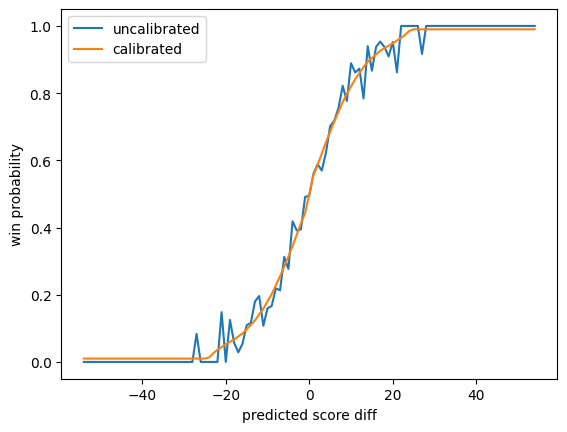

PlotlyKeyError: Invalid property specified for object of type plotly.graph_objs.Scatterpolar: 'xaxis'

Did you mean "ids"?

    Valid properties:
        cliponaxis
            Determines whether or not markers and text nodes are
            clipped about the subplot axes. To show markers and
            text nodes above axis lines and tick labels, make sure
            to set `xaxis.layer` and `yaxis.layer` to *below
            traces*.
        connectgaps
            Determines whether or not gaps (i.e. {nan} or missing
            values) in the provided data arrays are connected.
        customdata
            Assigns extra data each datum. This may be useful when
            listening to hover, click and selection events. Note
            that, "scatter" traces also appends customdata items in
            the markers DOM elements
        customdatasrc
            Sets the source reference on Chart Studio Cloud for
            `customdata`.
        dr
            Sets the r coordinate step.
        dtheta
            Sets the theta coordinate step. By default, the
            `dtheta` step equals the subplot's period divided by
            the length of the `r` coordinates.
        fill
            Sets the area to fill with a solid color. Use with
            `fillcolor` if not "none". scatterpolar has a subset of
            the options available to scatter. "toself" connects the
            endpoints of the trace (or each segment of the trace if
            it has gaps) into a closed shape. "tonext" fills the
            space between two traces if one completely encloses the
            other (eg consecutive contour lines), and behaves like
            "toself" if there is no trace before it. "tonext"
            should not be used if one trace does not enclose the
            other.
        fillcolor
            Sets the fill color. Defaults to a half-transparent
            variant of the line color, marker color, or marker line
            color, whichever is available.
        hoverinfo
            Determines which trace information appear on hover. If
            `none` or `skip` are set, no information is displayed
            upon hovering. But, if `none` is set, click and hover
            events are still fired.
        hoverinfosrc
            Sets the source reference on Chart Studio Cloud for
            `hoverinfo`.
        hoverlabel
            :class:`plotly.graph_objects.scatterpolar.Hoverlabel`
            instance or dict with compatible properties
        hoveron
            Do the hover effects highlight individual points
            (markers or line points) or do they highlight filled
            regions? If the fill is "toself" or "tonext" and there
            are no markers or text, then the default is "fills",
            otherwise it is "points".
        hovertemplate
            Template string used for rendering the information that
            appear on hover box. Note that this will override
            `hoverinfo`. Variables are inserted using %{variable},
            for example "y: %{y}" as well as %{xother}, {%_xother},
            {%_xother_}, {%xother_}. When showing info for several
            points, "xother" will be added to those with different
            x positions from the first point. An underscore before
            or after "(x|y)other" will add a space on that side,
            only when this field is shown. Numbers are formatted
            using d3-format's syntax %{variable:d3-format}, for
            example "Price: %{y:$.2f}".
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format
            for details on the formatting syntax. Dates are
            formatted using d3-time-format's syntax
            %{variable|d3-time-format}, for example "Day:
            %{2019-01-01|%A}". https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format for details on the
            date formatting syntax. Variables that can't be found
            will be replaced with the specifier. For example, a
            template of "data: %{x}, %{y}" will result in a value
            of "data: 1, %{y}" if x is 1 and y is missing.
            Variables with an undefined value will be replaced with
            the fallback value. The variables available in
            `hovertemplate` are the ones emitted as event data
            described at this link
            https://plotly.com/javascript/plotlyjs-events/#event-
            data. Additionally, all attributes that can be
            specified per-point (the ones that are `arrayOk: true`)
            are available.  Anything contained in tag `<extra>` is
            displayed in the secondary box, for example
            `<extra>%{fullData.name}</extra>`. To hide the
            secondary box completely, use an empty tag
            `<extra></extra>`.
        hovertemplatefallback
            Fallback string that's displayed when a variable
            referenced in a template is missing. If the boolean
            value 'false' is passed in, the specifier with the
            missing variable will be displayed.
        hovertemplatesrc
            Sets the source reference on Chart Studio Cloud for
            `hovertemplate`.
        hovertext
            Sets hover text elements associated with each (x,y)
            pair. If a single string, the same string appears over
            all the data points. If an array of string, the items
            are mapped in order to the this trace's (x,y)
            coordinates. To be seen, trace `hoverinfo` must contain
            a "text" flag.
        hovertextsrc
            Sets the source reference on Chart Studio Cloud for
            `hovertext`.
        ids
            Assigns id labels to each datum. These ids for object
            constancy of data points during animation. Should be an
            array of strings, not numbers or any other type.
        idssrc
            Sets the source reference on Chart Studio Cloud for
            `ids`.
        legend
            Sets the reference to a legend to show this trace in.
            References to these legends are "legend", "legend2",
            "legend3", etc. Settings for these legends are set in
            the layout, under `layout.legend`, `layout.legend2`,
            etc.
        legendgroup
            Sets the legend group for this trace. Traces and shapes
            part of the same legend group hide/show at the same
            time when toggling legend items.
        legendgrouptitle
            :class:`plotly.graph_objects.scatterpolar.Legendgroupti
            tle` instance or dict with compatible properties
        legendrank
            Sets the legend rank for this trace. Items and groups
            with smaller ranks are presented on top/left side while
            with "reversed" `legend.traceorder` they are on
            bottom/right side. The default legendrank is 1000, so
            that you can use ranks less than 1000 to place certain
            items before all unranked items, and ranks greater than
            1000 to go after all unranked items. When having
            unranked or equal rank items shapes would be displayed
            after traces i.e. according to their order in data and
            layout.
        legendwidth
            Sets the width (in px or fraction) of the legend for
            this trace.
        line
            :class:`plotly.graph_objects.scatterpolar.Line`
            instance or dict with compatible properties
        marker
            :class:`plotly.graph_objects.scatterpolar.Marker`
            instance or dict with compatible properties
        meta
            Assigns extra meta information associated with this
            trace that can be used in various text attributes.
            Attributes such as trace `name`, graph, axis and
            colorbar `title.text`, annotation `text`
            `rangeselector`, `updatemenues` and `sliders` `label`
            text all support `meta`. To access the trace `meta`
            values in an attribute in the same trace, simply use
            `%{meta[i]}` where `i` is the index or key of the
            `meta` item in question. To access trace `meta` in
            layout attributes, use `%{data[n[.meta[i]}` where `i`
            is the index or key of the `meta` and `n` is the trace
            index.
        metasrc
            Sets the source reference on Chart Studio Cloud for
            `meta`.
        mode
            Determines the drawing mode for this scatter trace. If
            the provided `mode` includes "text" then the `text`
            elements appear at the coordinates. Otherwise, the
            `text` elements appear on hover. If there are less than
            20 points and the trace is not stacked then the default
            is "lines+markers". Otherwise, "lines".
        name
            Sets the trace name. The trace name appears as the
            legend item and on hover.
        opacity
            Sets the opacity of the trace.
        r
            Sets the radial coordinates
        r0
            Alternate to `r`. Builds a linear space of r
            coordinates. Use with `dr` where `r0` is the starting
            coordinate and `dr` the step.
        rsrc
            Sets the source reference on Chart Studio Cloud for
            `r`.
        selected
            :class:`plotly.graph_objects.scatterpolar.Selected`
            instance or dict with compatible properties
        selectedpoints
            Array containing integer indices of selected points.
            Has an effect only for traces that support selections.
            Note that an empty array means an empty selection where
            the `unselected` are turned on for all points, whereas,
            any other non-array values means no selection all where
            the `selected` and `unselected` styles have no effect.
        showlegend
            Determines whether or not an item corresponding to this
            trace is shown in the legend.
        stream
            :class:`plotly.graph_objects.scatterpolar.Stream`
            instance or dict with compatible properties
        subplot
            Sets a reference between this trace's data coordinates
            and a polar subplot. If "polar" (the default value),
            the data refer to `layout.polar`. If "polar2", the data
            refer to `layout.polar2`, and so on.
        text
            Sets text elements associated with each (x,y) pair. If
            a single string, the same string appears over all the
            data points. If an array of string, the items are
            mapped in order to the this trace's (x,y) coordinates.
            If trace `hoverinfo` contains a "text" flag and
            "hovertext" is not set, these elements will be seen in
            the hover labels.
        textfont
            Sets the text font.
        textposition
            Sets the positions of the `text` elements with respects
            to the (x,y) coordinates.
        textpositionsrc
            Sets the source reference on Chart Studio Cloud for
            `textposition`.
        textsrc
            Sets the source reference on Chart Studio Cloud for
            `text`.
        texttemplate
            Template string used for rendering the information text
            that appears on points. Note that this will override
            `textinfo`. Variables are inserted using %{variable},
            for example "y: %{y}". Numbers are formatted using
            d3-format's syntax %{variable:d3-format}, for example
            "Price: %{y:$.2f}".
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format
            for details on the formatting syntax. Dates are
            formatted using d3-time-format's syntax
            %{variable|d3-time-format}, for example "Day:
            %{2019-01-01|%A}". https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format for details on the
            date formatting syntax. Variables that can't be found
            will be replaced with the specifier. For example, a
            template of "data: %{x}, %{y}" will result in a value
            of "data: 1, %{y}" if x is 1 and y is missing.
            Variables with an undefined value will be replaced with
            the fallback value. All attributes that can be
            specified per-point (the ones that are `arrayOk: true`)
            are available. Finally, the template string has access
            to variables `r`, `theta` and `text`.
        texttemplatefallback
            Fallback string that's displayed when a variable
            referenced in a template is missing. If the boolean
            value 'false' is passed in, the specifier with the
            missing variable will be displayed.
        texttemplatesrc
            Sets the source reference on Chart Studio Cloud for
            `texttemplate`.
        theta
            Sets the angular coordinates
        theta0
            Alternate to `theta`. Builds a linear space of theta
            coordinates. Use with `dtheta` where `theta0` is the
            starting coordinate and `dtheta` the step.
        thetasrc
            Sets the source reference on Chart Studio Cloud for
            `theta`.
        thetaunit
            Sets the unit of input "theta" values. Has an effect
            only when on "linear" angular axes.
        uid
            Assign an id to this trace, Use this to provide object
            constancy between traces during animations and
            transitions.
        uirevision
            Controls persistence of some user-driven changes to the
            trace: `constraintrange` in `parcoords` traces, as well
            as some `editable: true` modifications such as `name`
            and `colorbar.title`. Defaults to `layout.uirevision`.
            Note that other user-driven trace attribute changes are
            controlled by `layout` attributes: `trace.visible` is
            controlled by `layout.legend.uirevision`,
            `selectedpoints` is controlled by
            `layout.selectionrevision`, and `colorbar.(x|y)`
            (accessible with `config: {editable: true}`) is
            controlled by `layout.editrevision`. Trace changes are
            tracked by `uid`, which only falls back on trace index
            if no `uid` is provided. So if your app can add/remove
            traces before the end of the `data` array, such that
            the same trace has a different index, you can still
            preserve user-driven changes if you give each trace a
            `uid` that stays with it as it moves.
        unselected
            :class:`plotly.graph_objects.scatterpolar.Unselected`
            instance or dict with compatible properties
        visible
            Determines whether or not this trace is visible. If
            "legendonly", the trace is not drawn, but can appear as
            a legend item (provided that the legend itself is
            visible).
        
Did you mean "ids"?


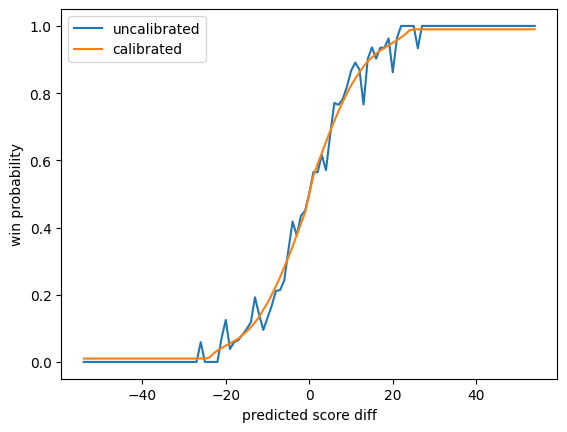

In [59]:
df = pd.DataFrame(
    {"Season": tourney_results_with_features["Season"], 
     "ScoreDiff": oof_score_diffs, 
     "Outcome": tourney_results_with_features["Outcome"], 
     "Category": tourney_results_with_features["Category"],
     "CalibratedPred" : oof_probs
     }
)
df["ScoreDiff"] = df["ScoreDiff"].astype(int)

predictions_df = df.groupby("ScoreDiff")[["Outcome","CalibratedPred"]].mean().reset_index()

plt.figure()
seaborn.lineplot(x = predictions_df["ScoreDiff"], y=predictions_df["Outcome"], label="uncalibrated")
seaborn.lineplot(x = predictions_df["ScoreDiff"], y=predictions_df["CalibratedPred"], label="calibrated")
plt.xlabel("predicted score diff")
plt.ylabel("win probability")
plt.show()

### 2. Classification on Outcome
To predict the probability of winning of a team against the other, we will now do classification, considering the Outcome column as a ground truth.  

In [60]:
optuna.logging.set_verbosity(optuna.logging.WARNING)

# CONFIG

FEATURE_COLS = minimal_raw_features
TARGET_COL = 'Outcome'   # 1 = T1 wins, 0 = T1 loses
TARGET_SEASON   = 2025

SEASONS = sorted(tourney_results_with_features['Season'].unique())
SEASONS.remove(TARGET_SEASON)

OPTUNA_TRIALS = 2

# cross-validation with one-season-out

def one_season_out_cv(df, feature_cols, target_col, params, verbose=False):
    """
    Leave-one-season-out CV.
    Returns per-fold log-loss and brier score, plus out-of-fold predictions.
    """
    oof_preds  = np.zeros(len(df))
    fold_scores = []

    for season in SEASONS:
        train = df[df['Season'] != season]
        val   = df[df['Season'] == season]

        X_train = train[feature_cols].values
        y_train = train[target_col].values
        X_val   = val[feature_cols].values
        y_val   = val[target_col].values

        model = xgb.XGBClassifier(
            **params,
            use_label_encoder=False,
            eval_metric='logloss',
            random_state=42,
        )
        model.fit(
            X_train, y_train,
            eval_set=[(X_val, y_val)],
            verbose=False,
        )

        preds = model.predict_proba(X_val)[:, 1]
        oof_preds[val.index] = preds

        fold_ll = log_loss(y_val, preds)
        fold_bs = brier_score_loss(y_val, preds)
        fold_scores.append({'season': season, 'log_loss': fold_ll, 'brier': fold_bs})

        if verbose:
            print(f"Season {season} — log_loss: {fold_ll:.4f}  brier: {fold_bs:.4f}")

    scores_df = pd.DataFrame(fold_scores)
    if verbose:
        print(f"\nMean log_loss : {scores_df['log_loss'].mean():.4f} ± {scores_df['log_loss'].std():.4f}")
        print(f"Mean brier    : {scores_df['brier'].mean():.4f} ± {scores_df['brier'].std():.4f}")

    return scores_df, oof_preds

# optuna objective (minimizes RMSE + variance to reduce both)

def objective(trial):
    params = {
        'n_estimators':     trial.suggest_int('n_estimators', 100, 600),
        'max_depth':        trial.suggest_int('max_depth', 2, 6),          # keep shallow — small dataset
        'learning_rate':    trial.suggest_float('learning_rate', 0.01, 0.2, log=True),
        'subsample':        trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'min_child_weight': trial.suggest_int('min_child_weight', 5, 30),  # strong regularization
        'gamma':            trial.suggest_float('gamma', 0.0, 2.0),
        'reg_alpha':        trial.suggest_float('reg_alpha', 0.0, 2.0),
        'reg_lambda':       trial.suggest_float('reg_lambda', 0.5, 5.0),
    }

    scores_df, _ = one_season_out_cv(
        tourney_results_with_features,
        FEATURE_COLS,
        TARGET_COL,
        params,
    )

    # Penalize high variance across folds, not just mean loss
    mean_ll = scores_df['log_loss'].mean()
    std_ll  = scores_df['log_loss'].std()
    return mean_ll + 0.5 * std_ll   # Optuna minimizes this


# Full pipeline

# optimization

study = optuna.create_study(
    direction='minimize',
    sampler=optuna.samplers.TPESampler(seed=42),
    pruner=optuna.pruners.MedianPruner(n_warmup_steps=10),
)
study.optimize(objective, n_trials=OPTUNA_TRIALS, show_progress_bar=True)

best_params = study.best_params

# final CV with best params to get OOF predictions
print(f"\n---------- TRAIN STATS -------------")

scores_df, oof_preds = one_season_out_cv(
    tourney_results_with_features,
    FEATURE_COLS,
    TARGET_COL,
    best_params,
    verbose=True,
)

# train final model on TARGET_SEASON

X_train = tourney_results_with_features[tourney_results_with_features["Season"]!=TARGET_SEASON][FEATURE_COLS].values
y_train = tourney_results_with_features[tourney_results_with_features["Season"]!=TARGET_SEASON][TARGET_COL].values
X_test  = tourney_results_with_features[tourney_results_with_features["Season"]==TARGET_SEASON][FEATURE_COLS].values
y_test  = tourney_results_with_features[tourney_results_with_features["Season"]==TARGET_SEASON][TARGET_COL].values

final_model = xgb.XGBClassifier(
    **best_params,
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=42,
)
final_model.fit(X_train, y_train)

y_pred = final_model.predict_proba(X_test)[:, 1]

ll = log_loss(y_test, y_pred)
bs = brier_score_loss(y_test, y_pred)

print(f"\n---------- TEST STATS -------------")
print(f"Season {TARGET_SEASON} — log_loss: {ll:.4f}  brier: {bs:.4f}")

# FEATURE IMPORTANCE

importance = pd.Series(
    final_model.feature_importances_,
    index=FEATURE_COLS
).sort_values(ascending=False)

print("\nFeature importances:\n", importance)

  0%|          | 0/2 [00:00<?, ?it/s]


---------- TRAIN STATS -------------
Season 2003 — log_loss: 0.5710  brier: 0.2031
Season 2004 — log_loss: 0.5339  brier: 0.1832
Season 2005 — log_loss: 0.5727  brier: 0.1988
Season 2006 — log_loss: 0.5699  brier: 0.1968
Season 2007 — log_loss: 0.4511  brier: 0.1501
Season 2008 — log_loss: 0.4975  brier: 0.1691
Season 2009 — log_loss: 0.4664  brier: 0.1575
Season 2010 — log_loss: 0.5067  brier: 0.1726
Season 2011 — log_loss: 0.5702  brier: 0.1997
Season 2012 — log_loss: 0.5058  brier: 0.1664
Season 2013 — log_loss: 0.5603  brier: 0.1892
Season 2014 — log_loss: 0.5480  brier: 0.1892
Season 2015 — log_loss: 0.4393  brier: 0.1462
Season 2016 — log_loss: 0.5982  brier: 0.1992
Season 2017 — log_loss: 0.5263  brier: 0.1825
Season 2018 — log_loss: 0.5938  brier: 0.1926
Season 2019 — log_loss: 0.4473  brier: 0.1518
Season 2021 — log_loss: 0.6089  brier: 0.2049
Season 2022 — log_loss: 0.5736  brier: 0.1894
Season 2023 — log_loss: 0.5766  brier: 0.1944
Season 2024 — log_loss: 0.4907  brier: 0.1

In [61]:
# ═══════════════════════════════════════════════════════════════════════════
# HOOK 2 — MATCHUP PREDICTOR
# Inserted right after final_model (XGBClassifier) is trained.
# Requires: final_model, minimal_raw_features, team_stats_df, _get_name
# ═══════════════════════════════════════════════════════════════════════════

out_pred = Output()

_seasons_p = sorted(team_stats_df['Season'].unique(), reverse=True)
_dd_season_p = widgets.Dropdown(
    options=_seasons_p, value=TARGET_SEASON,
    description='Season:', style={'description_width':'70px'},
    layout=Layout(width='160px')
)
_dd_t1 = widgets.Dropdown(
    description='Team 1:', style={'description_width':'65px'},
    layout=Layout(width='260px')
)
_dd_t2 = widgets.Dropdown(
    description='Team 2:', style={'description_width':'65px'},
    layout=Layout(width='260px')
)

def _update_pred_teams(change=None):
    s = _dd_season_p.value
    ids = sorted(team_stats_df[team_stats_df['Season']==s]['T1TeamID'].unique())
    opts = [(_get_name(t), t) for t in ids]
    _dd_t1.options = opts
    _dd_t2.options = opts
    if len(opts) > 1:
        _dd_t2.value = opts[1][1]

def _safe(row, col, default=0.0):
    return float(row[col]) if col in row.index else default

def _predict_matchup(change=None):
    s  = _dd_season_p.value
    t1 = _dd_t1.value
    t2 = _dd_t2.value
    if t1 is None or t2 is None or t1 == t2:
        return

    r1 = team_stats_df[(team_stats_df['Season']==s) & (team_stats_df['T1TeamID']==t1)]
    r2 = team_stats_df[(team_stats_df['Season']==s) & (team_stats_df['T1TeamID']==t2)]
    if r1.empty or r2.empty:
        return
    r1, r2 = r1.iloc[0], r2.iloc[0]

    elo1  = _safe(r1, 'T1_Elo', 1500)
    elo2  = _safe(r2, 'T1_Elo', 1500)
    feat_vals = {
        'Category':           float(r1.get('Category', 0)),
        'T1Seed':             _safe(r1, 'T1Seed'),
        'T2Seed':             _safe(r2, 'T1Seed'),
        'SeedDiff':           _safe(r1, 'T1Seed') - _safe(r2, 'T1Seed'),
        'T1LateSeasonRank':   _safe(r1, 'T1LateSeasonRank'),
        'T2LateSeasonRank':   _safe(r2, 'T1LateSeasonRank'),
        'LateSeasonRankDiff': _safe(r1, 'T1LateSeasonRank') - _safe(r2, 'T1LateSeasonRank'),
        'T1_avg_Score':       _safe(r1, 'T1_avg_Score'),
        'T1_avg_ScoreDiff':   _safe(r1, 'T1_avg_ScoreDiff'),
        'T2_avg_Score':       _safe(r2, 'T1_avg_Score'),
        'T2_avg_ScoreDiff':   _safe(r2, 'T1_avg_ScoreDiff'),
        'T1_Elo':             elo1,
        'T2_Elo':             elo2,
        'EloDiff':            elo1 - elo2,
        'elo_win_prob':       1 / (1 + 10 ** (-(elo1 - elo2) / 400)),
    }
    X_match = np.array([[feat_vals[f] for f in minimal_raw_features]])
    prob_t1 = float(final_model.predict_proba(X_match)[0][1])
    prob_t2 = 1 - prob_t1
    n1, n2  = _get_name(t1), _get_name(t2)

    fig = make_subplots(
        rows=1, cols=2,
        specs=[[{'type':'indicator'}, {'type':'bar'}]],
        subplot_titles=['Win probability', 'Head-to-head stats'],
    )

    gauge_col = '#534AB7' if prob_t1 >= 0.5 else '#D85A30'
    fig.add_trace(go.Indicator(
        mode='gauge+number+delta',
        value=round(prob_t1 * 100, 1),
        delta={'reference': 50, 'valueformat': '.1f'},
        gauge={
            'axis':      {'range': [0, 100], 'tickwidth': 1},
            'bar':       {'color': gauge_col},
            'steps':     [{'range':[0,50],'color':'#fde8e2'}, {'range':[50,100],'color':'#e8edf8'}],
            'threshold': {'line':{'color':'#333','width':2},'thickness':0.8,'value':50},
        },
        title={'text': f'{n1} win %'},
        number={'suffix': '%'},
    ), row=1, col=1)

    _cmp = [
        ('ELO',        'T1_Elo'),
        ('Seed',       'T1Seed'),
        ('Late rank',  'T1LateSeasonRank'),
        ('Avg score',  'T1_avg_Score'),
        ('Net eff.',   'T1_avg_NE'),
        ('eFG%',       'T1_avg_eFG'),
        ('OR Rate',    'T1_avg_ORRate'),
        ('TO Rate',    'T1_avg_TORate'),
    ]
    cmp_labels, cmp_t1, cmp_t2 = [], [], []
    for label, col in _cmp:
        if col in r1.index and col in r2.index:
            cmp_labels.append(label)
            cmp_t1.append(float(r1[col]))
            cmp_t2.append(float(r2[col]))

    fig.add_trace(go.Bar(name=n1, x=cmp_labels, y=cmp_t1,
                         marker_color='#534AB7', opacity=0.85), row=1, col=2)
    fig.add_trace(go.Bar(name=n2, x=cmp_labels, y=cmp_t2,
                         marker_color='#D85A30', opacity=0.85), row=1, col=2)

    fig.update_layout(
        title=(
            f'<b>{n1}</b>  {prob_t1*100:.1f}%'
            f'  vs  '
            f'<b>{n2}</b>  {prob_t2*100:.1f}%'
            f'  |  Season {s}'
        ),
        height=430,
        barmode='group',
        legend=dict(orientation='h', y=-0.18),
        margin=dict(t=70, b=70, l=20, r=20),
    )

    with out_pred:
        clear_output(wait=True)
        fig.show()

_dd_season_p.observe(lambda c: (_update_pred_teams(c), _predict_matchup(c)), names='value')
_dd_t1.observe(_predict_matchup, names='value')
_dd_t2.observe(_predict_matchup, names='value')
_update_pred_teams()

display(VBox([
    HTML('<h3 style="margin:0 0 10px">Matchup Predictor</h3>'),
    HBox([_dd_season_p, _dd_t1, _dd_t2]),
    out_pred,
]))
_predict_matchup()


Let's see the difference between regression calibrated probability and classification calibrated probability! Looks like the one fit on the spline is more stable.

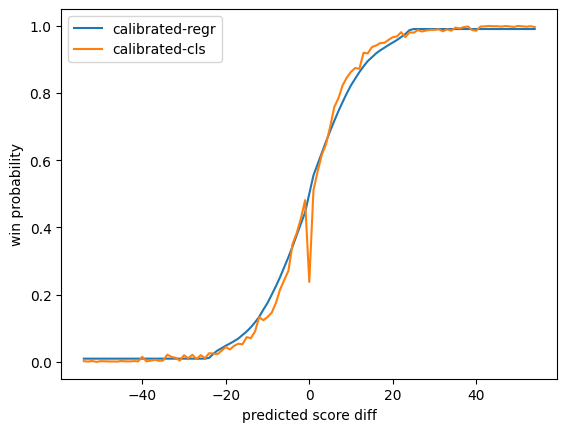

In [62]:
df["ClassificationPred"] = oof_preds
predictions_df = df.groupby("ScoreDiff")[["Outcome","CalibratedPred","ClassificationPred"]].mean().reset_index()

plt.figure()
seaborn.lineplot(x = predictions_df["ScoreDiff"], y=predictions_df["CalibratedPred"], label="calibrated-regr")
seaborn.lineplot(x = predictions_df["ScoreDiff"], y=predictions_df["ClassificationPred"], label="calibrated-cls")
plt.xlabel("predicted score diff")
plt.ylabel("win probability")
plt.show()

### Feature importance with Shapely values?

**NOTE FOR SHARIQ, YOU MIGHT INVESTIGATE THIS**

In [63]:
# ═══════════════════════════════════════════════════════════════════════════
# HOOK 3 — FEATURE INSPECTOR  (answers the NOTE FOR SHARIQ: SHAP values)
# Appended at the end of the notebook.
# Requires: final_model (XGBClassifier), X_train, minimal_raw_features
# ═══════════════════════════════════════════════════════════════════════════

try:
    import shap
except ImportError:
    import subprocess, sys
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', 'shap', '-q'])
    import shap

print('Computing SHAP values (may take ~10 s)...')
_explainer  = shap.TreeExplainer(final_model)
_shap_vals  = _explainer.shap_values(X_train)        # (n_samples, n_features)
_mean_shap  = np.abs(_shap_vals).mean(axis=0)         # mean |SHAP| per feature
print('Done!')

out_feat = Output()

_FEAT = minimal_raw_features

_slider_topn = widgets.IntSlider(
    value=len(_FEAT), min=3, max=len(_FEAT), step=1,
    description='Top-N:', style={'description_width':'58px'},
    layout=Layout(width='340px'),
)
_toggle_view = widgets.ToggleButtons(
    options=['Bar chart', 'Beeswarm', 'Dependence'],
    description='View:', style={'description_width':'50px', 'button_width':'105px'},
)
_dd_dep = widgets.Dropdown(
    options=_FEAT, value=_FEAT[int(np.argmax(_mean_shap))],
    description='Feature:', style={'description_width':'68px'},
    layout=Layout(width='310px', display='none'),
)

def _plot_features(change=None):
    n    = _slider_topn.value
    view = _toggle_view.value
    order     = np.argsort(_mean_shap)[::-1][:n]
    top_feats = [_FEAT[i] for i in order]
    top_vals  = [_mean_shap[i] for i in order]

    with out_feat:
        clear_output(wait=True)

        if view == 'Bar chart':
            fig = go.Figure(go.Bar(
                x=top_vals[::-1],
                y=top_feats[::-1],
                orientation='h',
                marker=dict(
                    color=top_vals[::-1],
                    colorscale=[[0,'#B0C4DE'],[0.5,'#534AB7'],[1,'#D85A30']],
                    showscale=True,
                    colorbar=dict(title='Mean |SHAP|', thickness=14),
                ),
            ))
            fig.update_layout(
                title='Feature importance — mean |SHAP value|',
                xaxis_title='Mean |SHAP value|',
                height=max(320, n * 28),
                margin=dict(l=170, r=20, t=50, b=40),
            )
            fig.show()

        elif view == 'Beeswarm':
            traces = []
            np.random.seed(42)
            for rank, (feat, idx) in enumerate(zip(top_feats, order)):
                sv = _shap_vals[:, idx]
                fv = X_train[:, idx]
                jitter = np.random.uniform(-0.3, 0.3, len(sv))
                traces.append(go.Scatter(
                    x=sv, y=rank + jitter, mode='markers',
                    marker=dict(
                        size=3, opacity=0.45,
                        color=fv, colorscale='RdBu_r',
                        showscale=(rank == 0),
                        colorbar=dict(title='Feature value', thickness=12, x=1.02),
                    ),
                    name=feat, showlegend=False,
                ))
            fig = go.Figure(traces)
            fig.add_vline(x=0, line_dash='dash', line_color='#aaa')
            fig.update_layout(
                title='SHAP beeswarm — feature impact on win probability',
                xaxis_title='SHAP value  (positive = increases win prob)',
                yaxis=dict(tickvals=list(range(n)), ticktext=top_feats, autorange='reversed'),
                height=max(320, n * 28),
                margin=dict(l=170, r=80, t=50, b=40),
            )
            fig.show()

        else:  # Dependence
            feat = _dd_dep.value
            if feat not in _FEAT:
                return
            idx  = _FEAT.index(feat)
            sv   = _shap_vals[:, idx]
            fv   = X_train[:, idx]
            # auto-detect best interaction feature
            corrs = [
                abs(np.corrcoef(sv, X_train[:, j])[0, 1]) if j != idx else 0
                for j in range(len(_FEAT))
            ]
            int_idx  = int(np.argmax(corrs))
            int_feat = _FEAT[int_idx]
            iv       = X_train[:, int_idx]

            fig = go.Figure(go.Scatter(
                x=fv, y=sv, mode='markers',
                marker=dict(
                    size=4, opacity=0.5,
                    color=iv, colorscale='Plasma',
                    showscale=True,
                    colorbar=dict(title=int_feat, thickness=13),
                ),
            ))
            fig.add_hline(y=0, line_dash='dash', line_color='#aaa')
            fig.update_layout(
                title=f'SHAP dependence: {feat}  (colour = {int_feat})',
                xaxis_title=feat,
                yaxis_title=f'SHAP value for {feat}',
                height=420,
                margin=dict(l=60, r=90, t=60, b=60),
            )
            fig.show()

def _on_view_change(change):
    _dd_dep.layout.display = 'flex' if _toggle_view.value == 'Dependence' else 'none'
    _plot_features()

_slider_topn.observe(_plot_features,   names='value')
_toggle_view.observe(_on_view_change,  names='value')
_dd_dep.observe(_plot_features,        names='value')

display(VBox([
    HTML('<h3 style="margin:0 0 10px">Feature Inspector (SHAP)</h3>'),
    HBox([_toggle_view, _slider_topn]),
    _dd_dep,
    out_feat,
]))
_plot_features()


Computing SHAP values (may take ~10 s)...
Done!


In [64]:
# ═══════════════════════════════════════════════════════════════════════════
# BONUS — single tabbed dashboard combining all three panels
# Run this cell to get everything in one place at the bottom of the notebook.
# ═══════════════════════════════════════════════════════════════════════════

_dashboard = Tab(children=[
    VBox([HTML('<h3 style="margin:4px 0 8px">Team Explorer</h3>'),
          HBox([_dd_season_ex, _dd_team_ex]), out_explorer]),
    VBox([HTML('<h3 style="margin:4px 0 8px">Matchup Predictor</h3>'),
          HBox([_dd_season_p, _dd_t1, _dd_t2]), out_pred]),
    VBox([HTML('<h3 style="margin:4px 0 8px">Feature Inspector</h3>'),
          HBox([_toggle_view, _slider_topn]), _dd_dep, out_feat]),
])
for i, t in enumerate(['Team Explorer', 'Matchup Predictor', 'Feature Inspector']):
    _dashboard.set_title(i, t)

display(_dashboard)
